# Base

# 1. LeetCode 16. 3Sum Closest 整数反转

Given an integer array nums of length n and an integer target, find three integers in nums such that the sum is closest to target.

Return the sum of the three integers.

You may assume that each input would have exactly one solution.

给你一个长度为 n 的整数数组 nums 和 一个目标值 target。请你从 nums 中选出三个整数，使它们的和与 target 最接近。

返回这三个数的和。

假定每组输入只存在恰好一个解。


Example 1:

```
Input: nums = [-1,2,1,-4], target = 1
Output: 2
Explanation: The sum that is closest to the target is 2. (-1 + 2 + 1 = 2).
```

Example 2:

```
Input: nums = [0,0,0], target = 1
Output: 0
```

Constraints:

- 3 <= nums.length <= 1000

- -1000 <= nums[i] <= 1000

- -10^4 <= target <= 10^4

## 解题思路

这一题的解法是用两个指针夹逼的方法。先对数组进行排序，i 从头开始往后面扫。这里同样需要注意数组中存在多个重复数字的问题。具体处理方法很多，可以用 map 计数去重。这里笔者简单的处理，i 在循环的时候和前一个数进行比较，如果相等，i 继续往后移，直到移到下一个和前一个数字不同的位置。j，k 两个指针开始一前一后夹逼。j 为 i 的下一个数字，k 为数组最后一个数字，由于经过排序，所以 k 的数字最大。j 往后移动，k 往前移动，逐渐夹逼出最接近 target 的值。

这道题还可以用暴力解法，三层循环找到距离 target 最近的组合。

In [1]:
from typing import List
class Solution:
    def threeSumClosest(self, nums: List[int], target: int) -> int:
        n = len(nums)
        nums.sort()
        re_min = 0 #存储当前最小的差值
        for i in range(n):
            low = i+1
            high = n-1
            while low < high:
                three_sum = nums[i] + nums[low] + nums[high]
                x = target - three_sum #当前三数的差值
                if re_min == 0:
                    re_min = abs(x)
                    sum_min = three_sum #sum_min为当前最接近的和
                if abs(x) < re_min:
                    re_min = abs(x)
                    sum_min = three_sum
                if three_sum == target:
                    return target
                elif three_sum < target:
                    low += 1
                else:
                    high -= 1
        return sum_min

# 2. LeetCode 17. Letter Combinations of a Phone Number 电话号码的字母组合

Given a string containing digits from 2-9 inclusive, return all possible letter combinations that the number could represent. Return the answer in any order.

A mapping of digit to letters (just like on the telephone buttons) is given below. Note that 1 does not map to any letters.

给定一个仅包含数字 2-9 的字符串，返回所有它能表示的字母组合。答案可以按 任意顺序 返回。

给出数字到字母的映射如下（与电话按键相同）。注意 1 不对应任何字母。

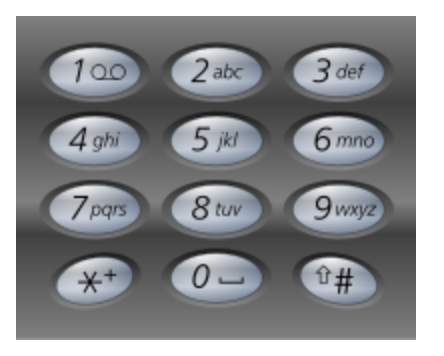

Example 1:

```
Input: digits = "23"
Output: ["ad","ae","af","bd","be","bf","cd","ce","cf"]
```

Example 2:

```
Input: digits = ""
Output: []
```

Example 3:

```
Input: digits = "2"
Output: ["a","b","c"]
```


Constraints:

- 0 <= digits.length <= 4

- digits[i] is a digit in the range ['2', '9'].(digits[i] 是范围 ['2', '9'] 的一个数字。)



## 解题思路

DFS 递归深搜

## Reference

1. https://www.bilibili.com/video/BV1cy4y167mM/

```
class Solution(object):
    def letterCombinations(self, digits):
        """
        动态规划
        dp[i]: 前i个字母的所有组合
        由于dp[i]只与dp[i-1]有关,可以使用变量代替列表存储降低空间复杂度
        :type digits: str
        :rtype: List[str]
        """
        if not digits:
            return []
        d = {'2': 'abc', '3': 'def', '4': 'ghi', '5': 'jkl',
             '6': 'mno', '7': 'pqrs', '8': 'tuv', '9': 'wxyz'}
        n = len(digits)
        dp = [[] for _ in range(n)]
        dp[0] = [x for x in d[digits[0]]]
        for i in range(1, n):
            dp[i] = [x + y for x in dp[i - 1] for y in d[digits[i]]]
        return dp[-1]

    def letterCombinations2(self, digits):
        """
        使用变量代替上面的列表
        降低空间复杂度
        :type digits: str
        :rtype: List[str]
        """
        if not digits:
            return []
        d = {'2': 'abc', '3': 'def', '4': 'ghi', '5': 'jkl',
             '6': 'mno', '7': 'pqrs', '8': 'tuv', '9': 'wxyz'}
        n = len(digits)
        res = ['']
        for i in range(n):
            res = [x + y for x in res for y in d[digits[i]]]
        return res

    def letterCombinations3(self, digits):
        """
        递归
        :param digits:
        :return:
        """
        d = {'2': 'abc', '3': 'def', '4': 'ghi', '5': 'jkl',
             '6': 'mno', '7': 'pqrs', '8': 'tuv', '9': 'wxyz'}
        if not digits:
            return []
        if len(digits) == 1:
            return [x for x in d[digits[0]]]
        return [x + y for x in d[digits[0]] for y in self.letterCombinations3(digits[1:])]
```

In [2]:
class Solution(object):
    def letterCombinations(self, digits):
        if not digits:
            return []
        d = {'2': 'abc', '3': 'def', '4': 'ghi', '5': 'jkl',
             '6': 'mno', '7': 'pqrs', '8': 'tuv', '9': 'wxyz'}
        n = len(digits)
        dp = [[] for _ in range(n)]
        dp[0] = [x for x in d[digits[0]]]
        for i in range(1, n):
            dp[i] = [x + y for x in dp[i - 1] for y in d[digits[i]]]
        return dp[-1]

# 3. LeetCode 19. Remove Nth Node From End of List 删除链表的倒数第 N 个结点

Given the head of a linked list, remove the $n^{th}$ node from the end of the list and return its head.

给你一个链表，删除链表的倒数第 n 个结点，并且返回链表的头结点。

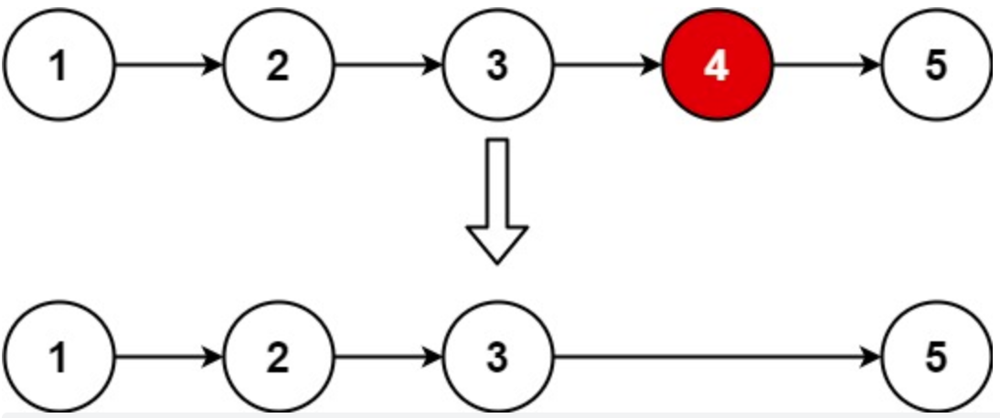

Example 1:

```
Input: head = [1,2,3,4,5], n = 2
Output: [1,2,3,5]
```

Example 2:

```
Input: head = [1], n = 1
Output: []
```

Example 3:

```
Input: head = [1,2], n = 1
Output: [1]
```

Constraints:

- The number of nodes in the list is sz.(链表中结点的数目为 sz)

- 1 <= sz <= 30

- 0 <= Node.val <= 100

- 1 <= n <= sz

Follow up: Could you do this in one pass?(你能尝试使用一趟扫描实现吗？)

## 解题思路

- 先循环一次拿到链表的总长度，然后循环到要删除的结点的前一个结点开始删除操作。需要注意的一个特例是，有可能要删除头结点，要单独处理。

- 这道题有一种特别简单的解法。设置 2 个指针，一个指针距离前一个指针 n 个距离。同时移动 2 个指针，2 个指针都移动相同的距离。当一个指针移动到了终点，那么前一个指针就是倒数第 n 个节点了。

## Reference

https://stackoverflow.com/questions/61610160/remove-nth-node-from-end-of-listleetcode-python

In [3]:
"""
class Solution:
    def removeNthFromEnd(self, head: ListNode, n: int) -> ListNode:
        head_dummy = ListNode()
        head_dummy.next = head

        slow, fast = head_dummy, head_dummy
        while(n!=0): # fast先往前走n步
            fast = fast.next
            n -= 1
        while(fast.next!=None):
            slow = slow.next
            fast = fast.next
        # fast 走到结尾后，slow 的下一个节点为倒数第N个节点
        slow.next = slow.next.next # 删除
        return head_dummy.next
"""
class Solution:
    def removeNthFromEnd(self, head, n):
        fast = slow = head
        for _ in range(n):
            fast = fast.next
        if not fast:
            return head.next
        while fast.next:
            fast = fast.next
            slow = slow.next
        slow.next = slow.next.next
        return head

# 4. LeetCode 5. Longest Palindromic Substring 最长回文子串

Given a string s, return the longest palindromic substring in s.

给你一个字符串 s，找到 s 中最长的回文子串。

Example 1:

```
Input: s = "babad"
Output: "bab"
Explanation: "aba" is also a valid answer.
```

解释："aba" 同样是符合题意的答案。

Example 2:

```
Input: s = "cbbd"
Output: "bb"
```

Constraints:

- 1 <= s.length <= 1000

- s consist of only digits and English letters.

s 仅由数字和英文字母组成


## 解题思路


解法一，动态规划。定义 dp[i][j] 表示从字符串第 i 个字符到第 j 个字符这一段子串是否是回文串。由回文串的性质可以得知，回文串去掉一头一尾相同的字符以后，剩下的还是回文串。所以状态转移方程是 dp[i][j] = (s[i] == s[j]) && ((j-i < 3) || dp[i+1][j-1])，注意特殊的情况，j - i == 1 的时候，即只有 2 个字符的情况，只需要判断这 2 个字符是否相同即可。j - i == 2 的时候，即只有 3 个字符的情况，只需要判断除去中心以外对称的 2 个字符是否相等。每次循环动态维护保存最长回文串即可。时间复杂度 O(n^2)，空间复杂度 O(n^2)。

解法二，中心扩散法。动态规划的方法中，我们将任意起始，终止范围内的字符串都判断了一遍。其实没有这个必要，如果不是最长回文串，无需判断并保存结果。所以动态规划的方法在空间复杂度上还有优化空间。判断回文有一个核心问题是找到“轴心”。如果长度是偶数，那么轴心是中心虚拟的，如果长度是奇数，那么轴心正好是正中心的那个字母。中心扩散法的思想是枚举每个轴心的位置。然后做两次假设，假设最长回文串是偶数，那么以虚拟中心往 2 边扩散；假设最长回文串是奇数，那么以正中心的字符往 2 边扩散。扩散的过程就是对称判断两边字符是否相等的过程。这个方法时间复杂度和动态规划是一样的，但是空间复杂度降低了。时间复杂度 O(n^2)，空间复杂度 O(1)。

解法三，滑动窗口。这个写法其实就是中心扩散法变了一个写法。中心扩散是依次枚举每一个轴心。滑动窗口的方法稍微优化了一点，有些轴心两边字符不相等，下次就不会枚举这些不可能形成回文子串的轴心了。不过这点优化并没有优化时间复杂度，时间复杂度 O(n^2)，空间复杂度 O(1)。

解法四，马拉车算法。这个算法是本题的最优解，也是最复杂的解法。时间复杂度 O(n)，空间复杂度 O(n)。中心扩散法有 2 处有重复判断，第一处是每次都往两边扩散，不同中心扩散多次，实际上有很多重复判断的字符，能否不重复判断？第二处，中心能否跳跃选择，不是每次都枚举，是否可以利用前一次的信息，跳跃选择下一次的中心？马拉车算法针对重复判断的问题做了优化，增加了一个辅助数组，将时间复杂度从 O(n^2) 优化到了 O(n)，空间换了时间，空间复杂度增加到 O(n)。

https://books.halfrost.com/leetcode/ChapterFour/0001~0099/0005.Longest-Palindromic-Substring/

In [4]:
class Solution:
    def longestPalindrome(self, s: str) -> str:
        if s == s[::-1]:
            return s
        max_len = 1
        ans = s[0]
        for i in range(1, len(s)):
            if i - max_len - 1 >= 0 and s[i - max_len - 1: i + 1] == s[i - max_len - 1: i + 1][::-1]:
                ans = s[i - max_len - 1: i + 1]
                max_len += 2
            if i - max_len >= 0 and s[i - max_len: i + 1] == s[i - max_len: i + 1][::-1]:
                ans = s[i - max_len: i + 1]
                max_len += 1
        return ans

# 5. LeetCode 56. Merge Intervals 合并区间

Given an array of intervals where intervals[i] = [$start_{i}, end_{i}$], merge all overlapping intervals, and return an array of the non-overlapping intervals that cover all the intervals in the input.

以数组 intervals 表示若干个区间的集合，其中单个区间为 intervals[i] = [$start_{i}, end_{i}$] 。请你合并所有重叠的区间，并返回 一个不重叠的区间数组，该数组需恰好覆盖输入中的所有区间 。


Example 1:

```
Input: intervals = [[1,3],[2,6],[8,10],[15,18]]
Output: [[1,6],[8,10],[15,18]]
Explanation: Since intervals [1,3] and [2,6] overlaps, merge them into [1,6].
```

Example 2:

```
Input: intervals = [[1,4],[4,5]]
Output: [[1,5]]
Explanation: Intervals [1,4] and [4,5] are considered overlapping.
```

Constraints:

- 1 <= intervals.length <= $10^4$

- intervals[i].length == 2

- 0 <= $start_{i}$ <= $end_{i}$ <= $10^4$


## 解题思路

先按照区间起点进行排序。然后从区间起点小的开始扫描，依次合并每个有重叠的区间。


In [5]:
from typing import List
class Solution:
    def merge(self, intervals: List[List[int]]) -> List[List[int]]:
        intervals.sort()   #排序列表，以区间开头升序排列
        ans = [intervals[0]]
        L, R = 1, 0
        while L < len(intervals):
            if ans[R][1] < intervals[L][0]:   #如果区间不重合，直接append
                ans.append(intervals[L])
                L += 1
                R += 1
            else:      #如果区间重合，就合并区间
                ans[R] = [ans[R][0], max(ans[R][1], intervals[L][1])]
                L += 1
        return ans

# 6. LeetCode 274. H-Index, H 指数

Given an array of integers citations where citations[i] is the number of citations a researcher received for their ith paper, return compute the researcher's h-index.

According to the definition of h-index on Wikipedia: A scientist has an index h if h of their n papers have at least h citations each, and the other n − h papers have no more than h citations each.

If there are several possible values for h, the maximum one is taken as the h-index.


给你一个整数数组 citations ，其中 citations[i] 表示研究者的第 i 篇论文被引用的次数。计算并返回该研究者的 h 指数。

根据维基百科上 h 指数的定义：h 代表“高引用次数”，一名科研人员的 h指数是指他（她）的 （n 篇论文中）总共有 h 篇论文分别被引用了至少 h 次。且其余的 n - h 篇论文每篇被引用次数 不超过 h 次。

如果 h 有多种可能的值，h 指数 是其中最大的那个。

Example 1:

```
Input: citations = [3,0,6,1,5]
Output: 3
Explanation: [3,0,6,1,5] means the researcher has 5 papers in total and each of them had received 3, 0, 6, 1, 5 citations respectively.
Since the researcher has 3 papers with at least 3 citations each and the remaining two with no more than 3 citations each, their h-index is 3.

给定数组表示研究者总共有 5 篇论文，每篇论文相应的被引用了 3, 0, 6, 1, 5 次。
由于研究者有 3 篇论文每篇 至少 被引用了 3 次，其余两篇论文每篇被引用 不多于 3 次，所以她的 h 指数是 3。
```

Example 2:

```
Input: citations = [1,3,1]
Output: 1
```

Constraints:

- n == citations.length

- 1 <= n <= 5000

- 0 <= citations[i] <= 1000


## 解题思路

可以先将数组里面的数从小到大排序。因为要找最大的 h-index，所以从数组末尾开始往前找，找到第一个数组的值，小于，总长度减去下标的值，这个值就是 h-index。

In [6]:
class Solution(object):
    def hIndex(self, citations):
        index = 0
        citations.sort(reverse=True)
        for i in citations:
            if i > index:
                index +=1
        return index

# 7. LeetCode 746. Min Cost Climbing Stairs

You are given an integer array cost where cost[i] is the cost of ith step on a staircase. Once you pay the cost, you can either climb one or two steps.

You can either start from the step with index 0, or the step with index 1.

Return the minimum cost to reach the top of the floor.

给你一个整数数组 cost ，其中 cost[i] 是从楼梯第 i 个台阶向上爬需要支付的费用。一旦你支付此费用，即可选择向上爬一个或者两个台阶。

你可以选择从下标为 0 或下标为 1 的台阶开始爬楼梯。

请你计算并返回达到楼梯顶部的最低花费。


Example 1:

```
Input: cost = [10,15,20]
Output: 15
Explanation: You will start at index 1.
- Pay 15 and climb two steps to reach the top.
The total cost is 15.
```
输入：cost = [10,15,20]
输出：15
解释：你将从下标为 1 的台阶开始。
- 支付 15 ，向上爬两个台阶，到达楼梯顶部。
总花费为 15 。


Example 2:

```
Input: cost = [1,100,1,1,1,100,1,1,100,1]
Output: 6
Explanation: You will start at index 0.
- Pay 1 and climb two steps to reach index 2.
- Pay 1 and climb two steps to reach index 4.
- Pay 1 and climb two steps to reach index 6.
- Pay 1 and climb one step to reach index 7.
- Pay 1 and climb two steps to reach index 9.
- Pay 1 and climb one step to reach the top.
The total cost is 6.
```

输入：cost = [1,100,1,1,1,100,1,1,100,1]
输出：6
解释：你将从下标为 0 的台阶开始。
- 支付 1 ，向上爬两个台阶，到达下标为 2 的台阶。
- 支付 1 ，向上爬两个台阶，到达下标为 4 的台阶。
- 支付 1 ，向上爬两个台阶，到达下标为 6 的台阶。
- 支付 1 ，向上爬一个台阶，到达下标为 7 的台阶。
- 支付 1 ，向上爬两个台阶，到达下标为 9 的台阶。
- 支付 1 ，向上爬一个台阶，到达楼梯顶部。
总花费为 6 。


Constraints:

- 2 <= cost.length <= 1000
- 0 <= cost[i] <= 999


In [7]:
class Solution:
    def minCostClimbingStairs(self, cost):
        cost.append(0)
        for i in range(2, len(cost)):
            cost[i] += min(cost[i - 1], cost[i - 2])
        return cost[-1]

## LeetCode 746. Img.

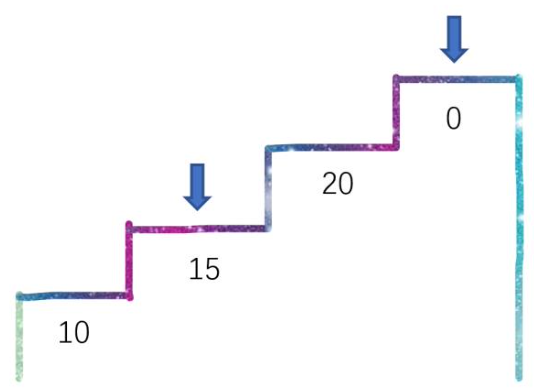

## 动态规划

1. 状态定义: dp[i]表示到达第i级台阶最小花费

2. 初始化: dp[0] = cost[0]; dp[1]=cost[1]

3. 转移方程: dp[i] = min(dp[i-1], dp[i-2]) + cost[i] (i >= 2)

可直接在 cost 列表空间上 DP

转移方程改为: cost[i] += min(cost[i-1], cost[i-2]) (i >= 2)

也為 O(n) time, O(1) space

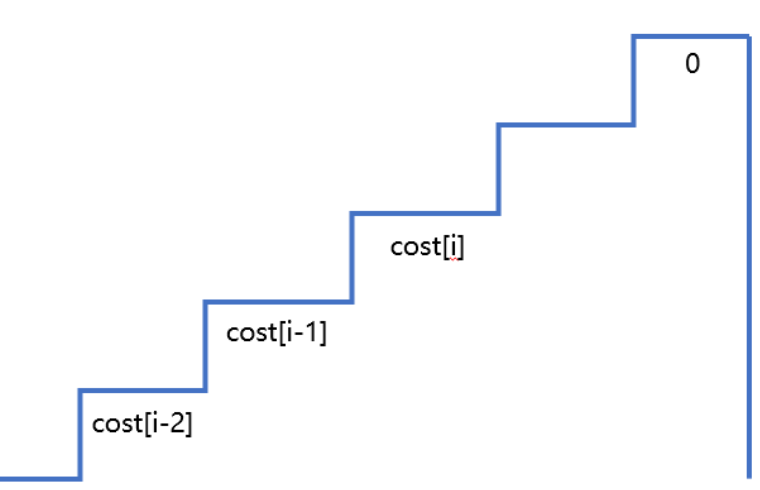

# 8. 最长公共子序列 (Longest Common Subsequence, LCS)

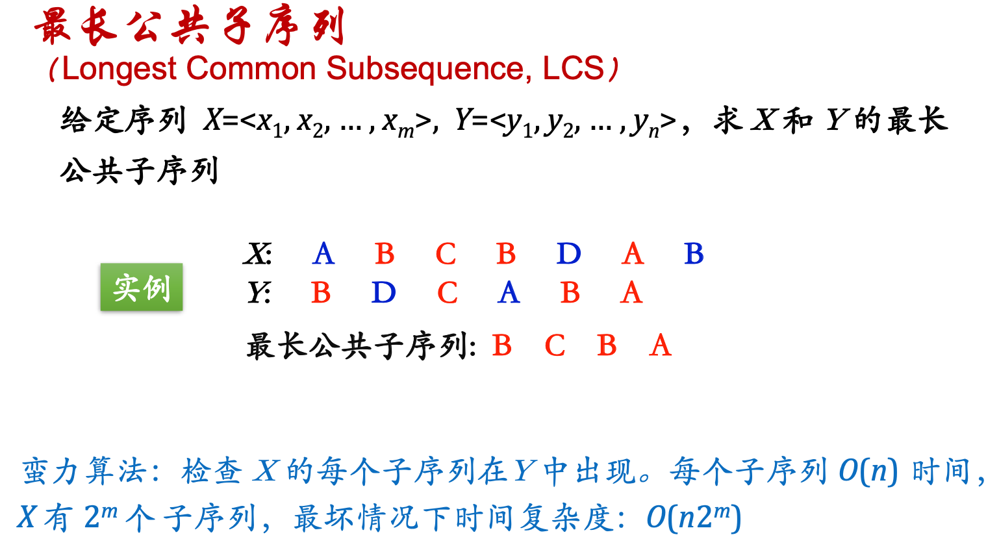

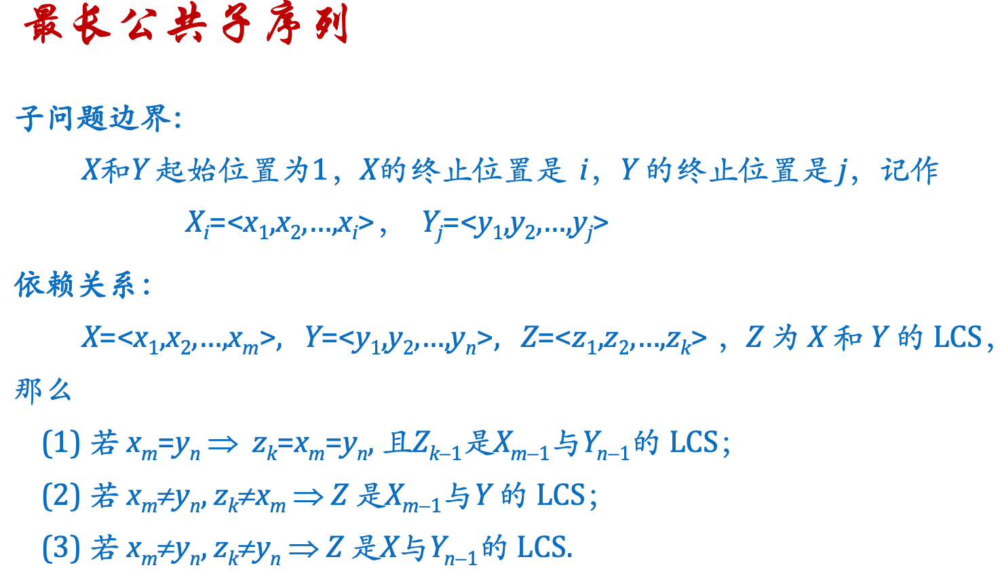

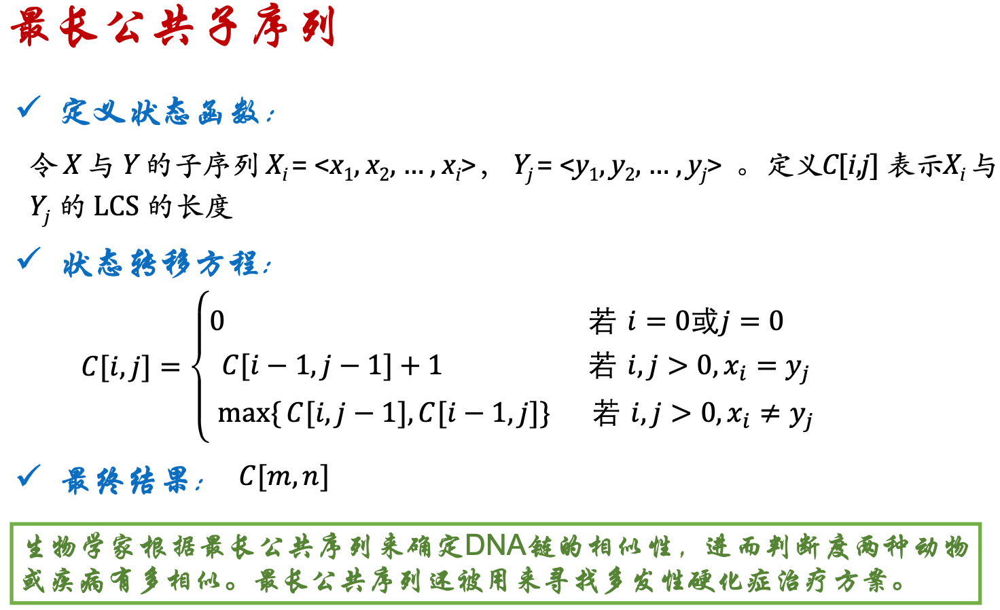

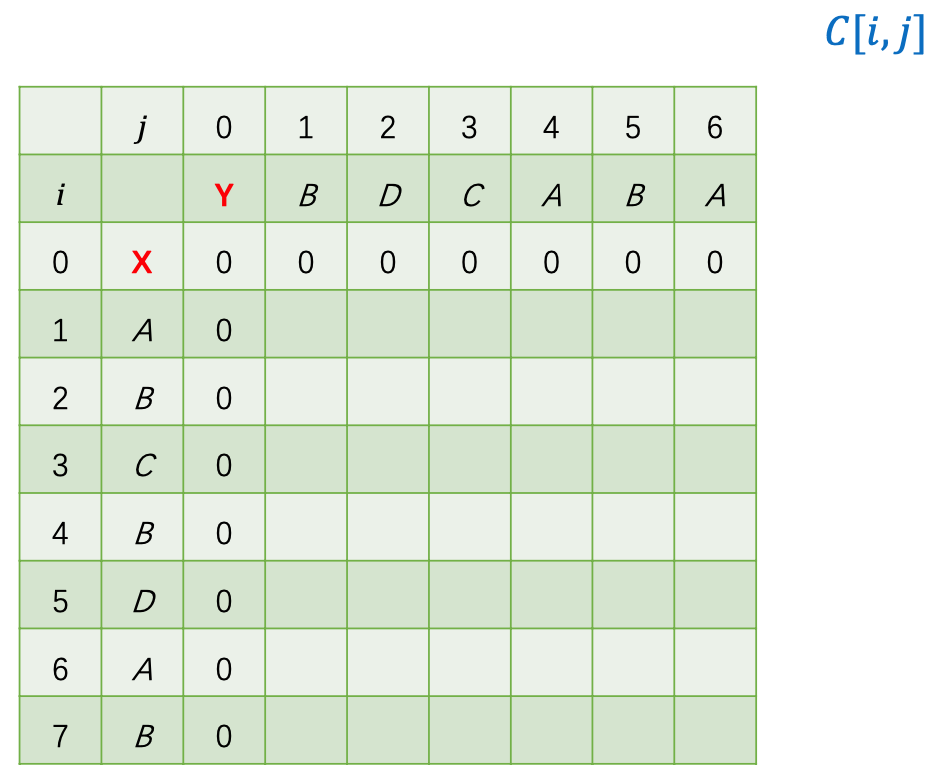

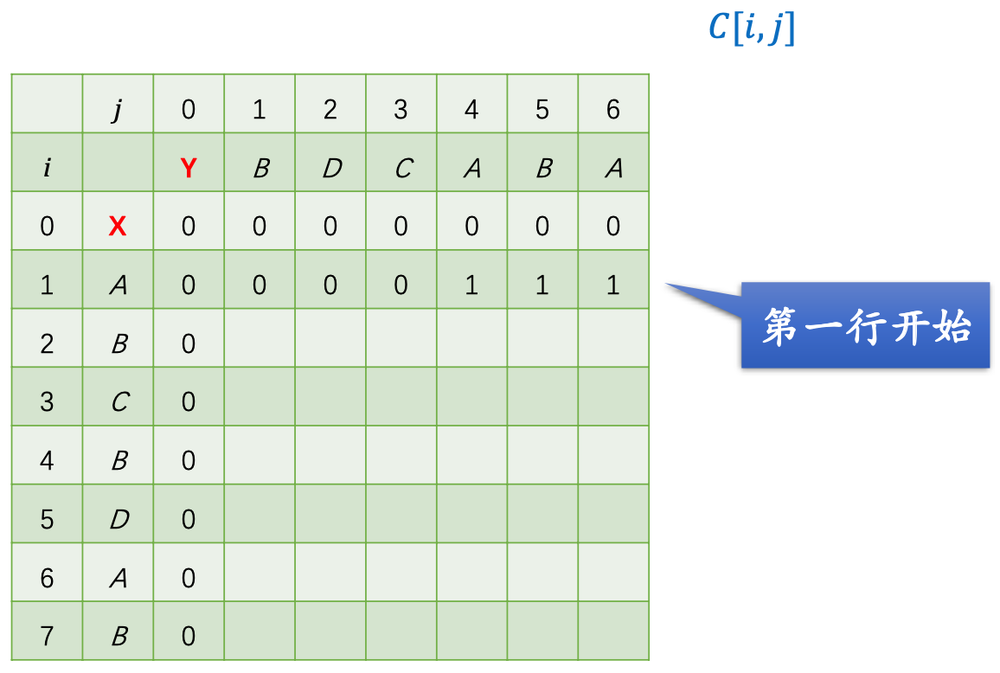

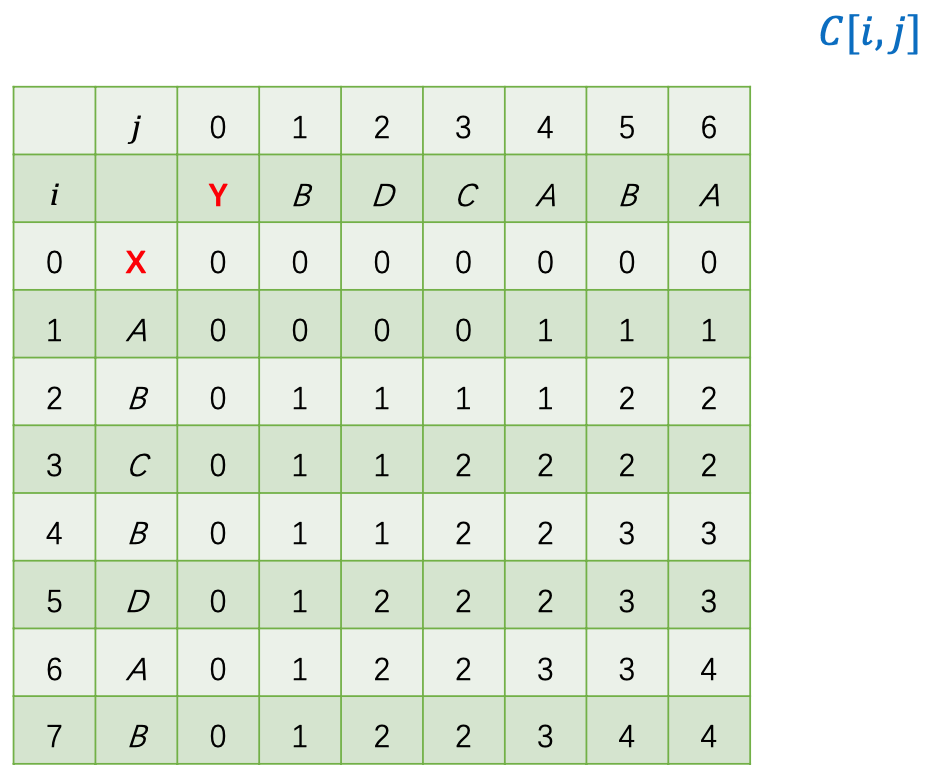

# 9. LeetCode 72. Edit Distance 编辑距离

Given two strings word1 and word2, return the minimum number of operations required to convert word1 to word2.

You have the following three operations permitted on a word:

- Insert a character

- Delete a character

- Replace a character


给你两个单词 word1 和 word2， 请返回将 word1 转换成 word2 所使用的最少操作数  。

你可以对一个单词进行如下三种操作：

- 插入一个字符

- 删除一个字符

- 替换一个字符


Example 1:

```
Input: word1 = "horse", word2 = "ros"
Output: 3
Explanation: 
horse -> rorse (replace 'h' with 'r')
rorse -> rose (remove 'r')
rose -> ros (remove 'e')

```

输入：word1 = "horse", word2 = "ros"
输出：3
解释：
horse -> rorse (将 'h' 替换为 'r')
rorse -> rose (删除 'r')
rose -> ros (删除 'e')


Example 2:

```
Input: word1 = "intention", word2 = "execution"
Output: 5
Explanation: 
intention -> inention (remove 't')
inention -> enention (replace 'i' with 'e')
enention -> exention (replace 'n' with 'x')
exention -> exection (replace 'n' with 'c')
exection -> execution (insert 'u')
```

输入：word1 = "intention", word2 = "execution"
输出：5
解释：
intention -> inention (删除 't')
inention -> enention (将 'i' 替换为 'e')
enention -> exention (将 'n' 替换为 'x')
exention -> exection (将 'n' 替换为 'c')
exection -> execution (插入 'u')


Constraints:


- 0 <= word1.length, word2.length <= 500

- word1 and word2 consist of lowercase English letters.

- word1 和 word2 由小写英文字母组成


In [8]:
class Solution:
    def minDistance(self, word1: str, word2: str) -> int:
        dp = [[0] * (len(word2)+1) for _ in range(len(word1)+1)]
        for i in range(len(word1)+1):
            dp[i][0] = i
        for j in range(len(word2)+1):
            dp[0][j] = j
        for i in range(1, len(word1)+1):
            for j in range(1, len(word2)+1):
                if word1[i-1] == word2[j-1]:
                    dp[i][j] = dp[i-1][j-1]
                else:
                    dp[i][j] = min(dp[i-1][j-1], dp[i-1][j], dp[i][j-1]) + 1
        return dp[-1][-1]

# 10. LeetCode 239. Sliding Window Maximum 滑动窗口最大值

You are given an array of integers nums, there is a sliding window of size k which is moving from the very left of the array to the very right. You can only see the k numbers in the window. Each time the sliding window moves right by one position.

Return the max sliding window.


给你一个整数数组 nums，有一个大小为 k 的滑动窗口从数组的最左侧移动到数组的最右侧。你只可以看到在滑动窗口内的 k 个数字。

滑动窗口每次只向右移动一位。返回 滑动窗口中的最大值 。


Example 1:

```
Input: nums = [1,3,-1,-3,5,3,6,7], k = 3
Output: [3,3,5,5,6,7]
Explanation: 
Window position                Max
---------------               -----
[1  3  -1] -3  5  3  6  7       3
 1 [3  -1  -3] 5  3  6  7       3
 1  3 [-1  -3  5] 3  6  7       5
 1  3  -1 [-3  5  3] 6  7       5
 1  3  -1  -3 [5  3  6] 7       6
 1  3  -1  -3  5 [3  6  7]      7
```

Example 2:

```
Input: nums = [1], k = 1
Output: [1]
```

Constraints:

- $1 <= nums.length <= 10^5$

- $-10^4 <= nums[i] <= 10^4$

- $1 <= k <= nums.length$


## 解题思路

- 給定一個數組和一個窗口為 K 的窗口，當窗口從數組的左邊滑動到數組右邊的時候，輸出每次移動窗口以後，在窗口內的最大值。

- 這道題最暴力的方法就是 2 層循環，時間複雜度 O(n * K)。

- 另一種思路是用優先隊列，每次窗口以後的時候都向優先隊列裡面新增一個節點，並刪除一個節點。時間複雜度是 O(n * log n)

- 最優的解法是用雙端隊列，隊列的一邊永遠都存的是窗口的最大值，隊列的另外一個邊存的是比最大值小的值。隊列中最大值左邊的所有值都出隊。在保證了雙端隊列的一邊即是最大值以後，時間複雜度是 O(n)，空間複雜度是 O(K)

In [9]:
class Solution(object):
    def maxSlidingWindow(self, nums, k):
        win, ret = [], []
        for i, v in enumerate(nums):
            if i >= k and win[0] <= i - k: win.pop(0)
            while win and nums[win[-1]] <= v: win.pop()
            win.append(i)
            if i >= k - 1: ret.append(nums[win[0]])
        return ret
# 思路：维护窗口，向右移动时左侧超出窗口的值弹出，
# 因为需要的是窗口内的最大值，
# 所以只要保证窗口内的值是递减的即可，小于新加入的值全部弹出。
# 最左端即为窗口最大值 python解法：
x = [1,3,-1,-3,5,3,6,7]
kn = 3
ob = Solution()
print(ob.maxSlidingWindow(x, kn))

[3, 3, 5, 5, 6, 7]


```
/*
  思路： 遍历数组 L R 为滑窗左右边界 只增不减
        双向队列保存当前窗口中最大的值的数组下标 双向队列中的数从大到小排序，
        新进来的数如果大于等于队列中的数 则将这些数弹出 再添加
        当R-L+1=k 时 滑窗大小确定 每次R前进一步L也前进一步 保证此时滑窗中最大值的
        数组下标在[L，R]中，并将当前最大值记录
  举例： nums[1，3，-1，-3，5，3，6，7] k=3
     1：L=0，R=0，队列【0】 R-L+1 < k
            队列代表值【1】
     2: L=0,R=1, 队列【1】 R-L+1 < k
            队列代表值【3】
     解释：当前数为3 队列中的数为【1】 要保证队列中的数从大到小 弹出1 加入3
          但队列中保存的是值对应的数组下标 所以队列为【1】 窗口长度为2 不添加记录
     3: L=0,R=2, 队列【1，2】 R-L+1 = k ,result={3}
            队列代表值【3，-1】
     解释：当前数为-1 队列中的数为【3】 比队列尾值小 直接加入 队列为【3，-1】
          窗口长度为3 添加记录记录为队首元素对应的值 result[0]=3
     4: L=1,R=3, 队列【1，2，3】 R-L+1 = k ,result={3，3}
            队列代表值【3，-1,-3】
     解释：当前数为-3 队列中的数为【3，-1】 比队列尾值小 直接加入 队列为【3，-1，-3】
          窗口长度为4 要保证窗口大小为3 L+1=1 此时队首元素下标为1 没有失效
          添加记录记录为队首元素对应的值 result[1]=3
     5: L=2,R=4, 队列【4】 R-L+1 = k ,result={3，3，5}
            队列代表值【5】
     解释：当前数为5 队列中的数为【3，-1，-3】 保证从大到小 依次弹出添加 队列为【5】
          窗口长度为4 要保证窗口大小为3 L+1=2 此时队首元素下标为4 没有失效
          添加记录记录为队首元素对应的值 result[2]=5
    依次类推 如果队首元素小于L说明此时值失效 需要弹出
*/
class Solution {
    public int[] maxSlidingWindow(int[] nums, int k) {
        if(nums==null||nums.length<2) return nums;
        // 双向队列 保存当前窗口最大值的数组位置 保证队列中数组位置的数按从大到小排序
        LinkedList<Integer> list = new LinkedList();
        // 结果数组
        int[] result = new int[nums.length-k+1];
        for(int i=0;i<nums.length;i++){
            // 保证从大到小 如果前面数小 弹出
            while(!list.isEmpty()&&nums[list.peekLast()]<=nums[i]){
                list.pollLast();
            }
            // 添加当前值对应的数组下标
            list.addLast(i);
            // 初始化窗口 等到窗口长度为k时 下次移动在删除过期数值
            if(list.peek()<=i-k){
                list.poll();   
            } 
            // 窗口长度为k时 再保存当前窗口中最大值
            if(i-k+1>=0){
                result[i-k+1] = nums[list.peek()];
            }
        }
        return result;
    }
}
```

# 11. LeetCode 206. Reverse Linked List 反转链表

Given the head of a singly linked list, reverse the list, and return the reversed list.

给你单链表的头节点 head ，请你反转链表，并返回反转后的链表。

Example 1:

```
Input: head = [1,2,3,4,5]
Output: [5,4,3,2,1]
```

Example 2:

```
Input: head = [1,2]
Output: [2,1]
```

Example 3:

```
Input: head = []
Output: []
```

Constraints - 提示:

- The number of nodes in the list is the range [0, 5000].(链表中节点的数目范围是 [0, 5000])

- -5000 <= Node.val <= 5000


Follow-up: 

A linked list can be reversed either iteratively or recursively. Could you implement both?

链表可以选用迭代或递归方式完成反转。你能否用两种方法解决这道题？


## 解题思路

两种思路 1.后挂 2.交换

```
# Knowledge Point

class ListNode:
    def __init__(self, x):
        self.val = x
        self.next = None

    def __repr__(self):
        if self:
            return "{} -> {}".format(self.val, repr(self.next))

    if __name__ == "__main__":
        head = ListNode(1)
        head.next = ListNode(2)
        head.next.next = ListNode(3)
        head.next.next.next = ListNode(4)
        head.next.next.next.next = ListNode(5)
        print(head)
```

## Reference

1. https://ithelp.ithome.com.tw/m/articles/10271920

2. https://ithelp.ithome.com.tw/articles/10263980

In [10]:
class ListNode:
    def __init__(self, x):
        self.val = x
        self.next = None

    def __repr__(self):
        if self:
            return "{} -> {}".format(self.val, repr(self.next))

class Solution:
    def reverseList(self, head):
        dummy = ListNode(float("-inf"))
        while head:
            dummy.next, head.next, head = head, dummy.next, head.next
        return dummy.next

# 交換法

class Solution:
    # def reverseList(self, head: Optional[ListNode]) -> Optional[ListNode]:
    def reverseList(self, head):
        prev = None
        while head:
            next = head.next
            head.next = prev
            prev = head
            head = next
        return prev

# 遞迴法
class Solution:
    # def reverseList(self, head: Optional[ListNode], prev=None) -> Optional[ListNode]:
    def reverseList(self, head):
        if not head: return prev
        next = head.next # 先把下一個記起來
        head.next = prev # 將自己反過來指向前一個
        return self.reverseList(next, head)

# 12. LeetCode 15. 3Sum 三数之和

Given an integer array nums, return all the triplets [nums[i], nums[j], nums[k]] such that i != j, i != k, and j != k, and nums[i] + nums[j] + nums[k] == 0.

Notice that the solution set must not contain duplicate triplets.



给你一个整数数组 nums，有一个大小为 k 的滑动窗口从数组的最左侧移动到数组的最右侧。你只可以看到在滑动窗口内的 k 个数字。

滑动窗口每次只向右移动一位。返回 滑动窗口中的最大值 。


Example 1:

```
Input: nums = [-1,0,1,2,-1,-4]
Output: [[-1,-1,2],[-1,0,1]]
```

Example 2:

```
Input: nums = []
Output: []
```

Example 3:

```
Input: nums = [0]
Output: []
```

Constraints:

- 0 <= nums.length <= 3000
- -10^5 <= nums[i] <= 10^5


## 解题思路

用 map 提前计算好任意 2 个数字之和，保存起来，可以将时间复杂度降到 O(n^2)。这一题比较麻烦的一点在于，最后输出解的时候，要求输出不重复的解。数组中同一个数字可能出现多次，同一个数字也可能使用多次，但是最后输出解的时候，不能重复。例如 [-1，-1，2] 和 [2, -1, -1]、[-1, 2, -1] 这 3 个解是重复的，即使 -1 可能出现 100 次，每次使用的 -1 的数组下标都是不同的。

这里就需要去重和排序了。map 记录每个数字出现的次数，然后对 map 的 key 数组进行排序，最后在这个排序以后的数组里面扫，找到另外 2 个数字能和自己组成 0 的组合。

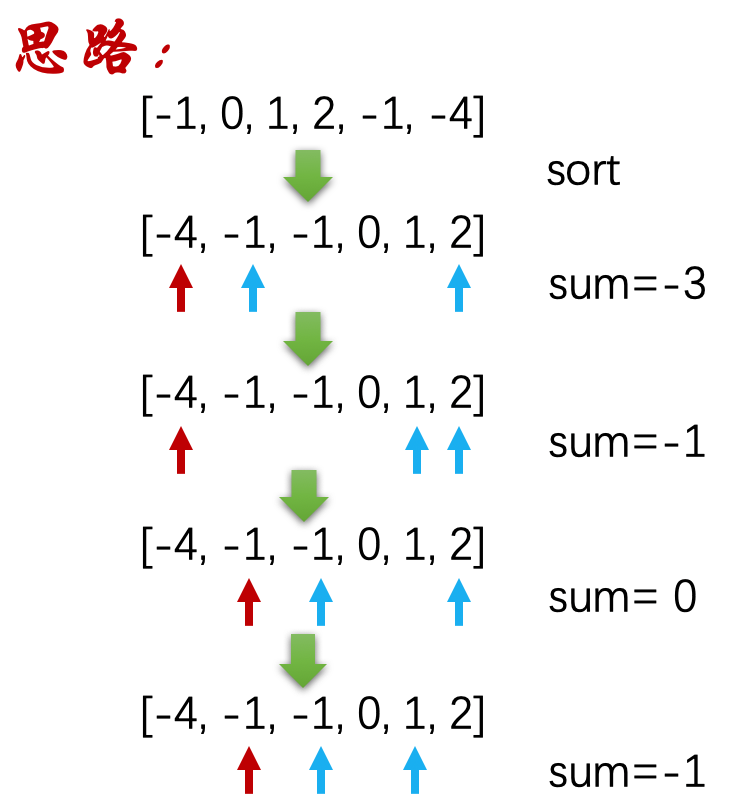

In [11]:
class Solution(object):
    def threeSum(self, nums):
        if len(nums) < 3:
            return[]
        if all (num == 0 for num in nums):
            return [[ 0, 0, 0]]
        found = []
        nums = sorted(nums)
        rightmost = len(nums) - 1
        for index, eachNum in enumerate(nums):
            left = index + 1
            right = rightmost
            while left < right:
                check_sum = (eachNum + nums[left] + nums[right])
                if check_sum == 0:
                    new_found = [eachNum, nums[left], nums[right]]
                    if new_found not in found:
                        found.append(new_found)
                    right -= 1
                elif check_sum < 0:
                    left += 1
                else :
                    right -= 1
        return found

## 複雜度低版本
class Solution2(object):
    def threeSum(self, nums):
        if len(nums) < 3:
            return []
        if all (num == 0 for num in nums):
            return [[0, 0, 0]]
        found = []
        nums = sorted(nums)
        rightmost = len(nums) - 1
        for index, eachNum in enumerate(nums):
            if index > 0 and nums[index] == nums[index - 1]:
                continue
            left = index + 1
            right = rightmost
            while left < right:
                check_sum = (eachNum + nums[left] + nums[right])
                if check_sum == 0:
                    found.append([eachNum, nums[left], nums[right]])
                    left += 1
                    while left < right and nums[left] == nums[left - 1]:
                        left += 1
                elif check_sum < 0:
                    left += 1
                else :
                    right -= 1
        return found

# 13. 乱序字符串检查

乱序字符串是指一个字符串只是另一个字符串的重新排列。

例如，'heart' 和 'earth' 就是乱序字符串。 'python' 和'typhon' 也是。

为了简单起见，我们假设所讨论的两个字符串具有相等的长度，并且他们由26个小写 字母集合组成。

我们的目标是写一个布尔函数，它将两个字符串做参数并返回它们是不是乱序。

- 解法一: 逐字检查

- 解法二: 排序与比较

- 解法三: 计数与比较

## 乱序字符串检查 - 解法一: 逐字检查

In [12]:
def anagramSolution1(s1, s2):
    alist = list(s2)
    pos1 = 0
    stillOK = True
    while pos1 < len(s1) and stillOK:
        pos2 = 0
        found = False
        while pos2 < len(alist) and not found:
            if s1[pos1] == alist[pos2]:
                found = True
            else:
                pos2 = pos2 + 1
        if found :
            alist[pos2] = None
            pos1 = pos1 + 1
        else:
            stillOK = False
    return stillOK and (len(list(filter(None, alist))) == 0)
print(anagramSolution1('eat', 'eat'))
print(anagramSolution1('eat', 'ade'))

True
False


## 乱序字符串检查 - 解法二: 排序与比较

In [13]:
def anagramSolution2(s1, s2):
    alist1 = list(s1)
    alist2 = list(s2)
    alist1.sort()
    alist2.sort()
    pos = 0
    matches = True

    while pos < len(s1) and matches:
        if alist1[pos] == alist2[pos] :
            pos = pos + 1
        else:
            matches = False
    return matches

print(anagramSolution2('eat', 'eat'))
print(anagramSolution2('eat', 'ade'))

True
False


## 乱序字符串检查 - 解法三: 计数与比较

In [14]:
# 利用 ASCII TABLE

def anagramSolution3(s1, s2):
    c1 = [0] * 26
    c2 = [0] * 26
    for i in range(len(s1)):
        pos = ord(s1[i]) - ord('a')
        c1[pos] = c1[pos] + 1
    for i in range(len(s2)):
        pos = ord(s2[i]) - ord('a')
        c2[pos] = c2[pos] + 1
    j = 0
    stillOK = True
    while j < 26 and stillOK:
        if c1[j] == c2[j]:
            j = j + 1
        else :
            stillOK = False
    return stillOK

print(anagramSolution3('eat', 'eat'))
print(anagramSolution3('eat', 'ade'))

True
False


# 14. 二分搜尋法 (Binary Search)

【定義】如果資料已先排序過，則可使用二分法來進行搜尋。二分法是將資料分成兩部份，再將鍵值與中間值比較，如鍵值相等則找到，小於再比前半段，大於再比後半段。如此，分段比較至找到或無資料為止。

【優點】搜尋效率佳(平均次數=Log2N)。

【缺點】 (1) 資料必需事先排序。(2) 檔案資料必需使是可直接存取或隨機檔。

【時間複雜度】因為每次比較都會比上一次少一半之資料，因此最多只需要比較。

【演算法】

```c
    Searchtime = 0;                   //搜尋次數初值設定為
    Middle = (int)((Low + High)/2);   //搜尋中間值
    do {
        Searchtime = Searchtime + 1;
        if (Temp[Middle] == Key)       //找到資料
        {
            printf("該數字是排在第 %d 個順位",Middle);
            //顯示資料位置
            printf("一共搜尋 %d 次",Searchtime);
            //顯示搜尋次數
            break;    //跳出迴圈
        }
        else if(Temp[Middle] < Key)
                Low = Middle + 1;          //改變左半部
            else  High = Middle - 1;     //改變右半部
        Middle = (int)((Low + High) / 2);  //改變中間值
    }
    while(Low <= High);
```

In [15]:
# KP
# 二分查找
def binarySearch(alist, item):
    first = 0
    last = len(alist) -1
    found = False
    while first <= last and not found:
        midpoint = (first + last) // 2
        if alist[midpoint] == item:
            found = True
        else:
            if item < alist[midpoint]:
                last = midpoint - 1
            else :
                first = midpoint + 1
    return found
testlist = [0, 1, 2, 8, 13, 17, 19, 32, 42]
print(binarySearch(testlist, 3))
print(binarySearch(testlist, 13))

False
True


# 15. 排序


- 冒泡排序, 氣泡排序法, Bubble Sort

又稱交換排序法，原理是從第一筆資料開始，逐一比較相鄰兩筆資料，如果兩筆大小順序有誤則做交換，反之則不動，接者再進行下一筆資料比較，所有資料比較完第1回合後，可以確保最後一筆資料是正確的位置。


- 选择排序, 選擇排序法, Selection Sort

原理是反覆從未排序數列中找出最小值，將它與左邊的數做交換。可以有兩種方式排序，一為由大到小排序時，將最小值放到末端;若由小到大排序時，則將最小值放到前端。例如:未排序的數列中找到最小值的資料，和第1筆資料交換位置，再從剩下未排序的資料列中找到最小值的資料，和第2筆資料交換位置，以此類推。


- 归并排序, 合併排序法, Merge Sort

原理是會先將原始資料分割成兩個資料列，接著再將兩個資料繼續分割成兩個資料列，依此類推，直到無法再分割，也就是每組都只剩下一筆資料時，再兩兩合併各組資料，合併時也會進行該組排序，每次排序都是比較最左邊的資料，將較小的資料加到新的資料列中，依此類推，直到最後合併成一個排序好的資料列為止。


- 快速排序, 快速排序法, Quick Sort

又稱分割交換排序法，是目前公認效率極佳的演算法，使用了分治法(Divide and Conquer)的概念。原理是先從原始資料列中找一個基準值(Pivot)，接著逐一將資料與基準值比較，小於基準值的資料放在左邊，大於基準值的資料放在右邊，再將兩邊區塊分別再找出基準值，重複前面的步驟，直到排序完為止。


- 插入排序, 插入排序法, Insertion Sort

原理是逐一將原始資料加入已排序好資料中，並逐一與已排序好的資料作比較，找到對的位置插入。例如:已有2筆排序好資料，將第3筆資料與前面已排序好的2筆資料作比較，找到對的位置插入，再將第4筆資料與前面已排序好的3筆資料作比較，找到對的位置插入，以此類推。

## Reference

氣泡排序法 - Bubble Sort : https://ithelp.ithome.com.tw/articles/10276184

選擇排序法 - Selection Sort : https://ithelp.ithome.com.tw/articles/10276719

合併排序法 - Merge Sort : https://ithelp.ithome.com.tw/articles/10278179

快速排序法 - Quick Sort : https://ithelp.ithome.com.tw/articles/10278644

插入排序法 - Insertion Sort : https://ithelp.ithome.com.tw/articles/10277360

In [16]:
# KP
# 冒泡排序
# code
def bubbleSort(alist):
    for passnum in range(len(alist) -1, 0, -1):
        for i in range(passnum):
            if alist[i] > alist[i + 1]:
                temp = alist[i]
                alist[i] = alist[i + 1]
                alist[i + 1] = temp
alist = [54, 26, 93, 17, 77, 31, 44, 55, 20]
bubbleSort(alist)
print(alist)

# Run Test
def bubbleSort(alist):
    for passnum in range(len(alist)-1, 0, -1):
        print(passnum)
        for i in range(passnum):
            if alist[i] > alist[i + 1]:
                temp = alist[i]
                alist[i] = alist[i+1]
                alist[i+1] = temp
            print(alist)

alist = [54, 26, 93, 17]
print("bubbleSort :")
print(alist)
bubbleSort(alist)
print(alist)

# KP
# 选择排序

def selectionSort(alist):
    for fillslot in range(len(alist) - 1, 0, -1):
        positionOfMax = 0
        for location in range(1, fillslot + 1):
            if alist[location] > alist[positionOfMax]:
                positionOfMax = location
        temp = alist[fillslot]
        alist[fillslot] = alist[positionOfMax]
        alist[positionOfMax] = temp
alist = [ 54, 26, 93, 17, 77, 31, 44, 55 ,20]
selectionSort(alist)
print(alist)

# Run Test
def selectionSort(alist):
    for fillsolt in range(len(alist)-1,0,-1):
        print(fillsolt)
        positionOfMax = 0
        for location in range(1, fillsolt + 1):
            if alist[location] > alist[positionOfMax]:
                positionOfMax = location
        temp = alist[fillsolt]
        alist[fillsolt] = alist[positionOfMax]
        alist[positionOfMax] = temp
        print(alist)

print("selectionSort : ")
alist = [54, 26, 93, 17]
print(alist)
selectionSort(alist)
print(alist)

# KP
# *** 归并排序
def mergeSort(alist):
    if len(alist) > 1:
        mid = len(alist)//2
        lefthalf = alist[:mid]
        righthalf = alist[mid:]
        mergeSort(lefthalf)
        mergeSort(righthalf)
        l, j, k = 0,0,0
        while i < len(lefthalf) and j < len (righthalf):
            if lefthalf[i] < righthalf[j]:
                alist[k] = lefthalf[i]
                i = i + 1
            else :
                alist[k] = righthalf[j]
                j = j + 1
            k = k + 1
        while i < len(lefthalf):
            alist[k] = lefthalf[i]
            i = i + 1
            k = k + 1
        while j < len(righthalf):
            alist[k] = righthalf[j]
            j = j + 1
            k = k + 1

k = 0
def mergeSort(alist):
    global k
    k = k + 1
    print("invoke function %d" %(k))
    print("Splitting ", alist)
    if len(alist) > 1:
        mid = len(alist)//2
        lefthalf = alist[:mid]
        righthalf = alist[mid:]
        mergeSort(lefthalf)
        mergeSort(righthalf)
        i, j, k = 0,0,0
        while i < len(lefthalf) and j < len(righthalf):
            if lefthalf[i] < righthalf[j]:
                alist[k] = lefthalf[i]
                i = i + 1
            else:
                alist[k] = righthalf[j]
                j = j + 1
            k = k + 1
        while i < len(lefthalf):
            alist[k] = lefthalf[i]
            i = i + 1
            k = k + 1
        while j < len(righthalf):
            alist[k] = righthalf[j]
            j = j + 1
            k = k + 1
    print("Merging ", alist)
print("mergeSort : ")
alist = [ 54, 26, 93, 17]
print(alist)
mergeSort(alist)
print(alist)

# KP
# *** 插入排序

def insertionSort(alist):
    for index in range(1, len(alist)):
        currentvalue = alist[index]
        position = index
        while position > 0 and alist[position - 1] > currentvalue:
            alist[position] = alist[position - 1]
            position = position - 1
        alist[position] = currentvalue
alist = [ 54, 26, 93, 17, 77, 31, 44, 55, 20]
insertionSort(alist)
print(alist)

def insertionSort(alist):
    for index in range(1, len(alist)):
        print(index)
        currentvalue = alist[index]
        position = index
        while position > 0 and alist[position - 1] > currentvalue:
            alist[position] = alist[position - 1]
            position = position - 1
        alist[position] = currentvalue
        print(alist)
print("insertionSort : ")
alist = [54, 26, 93, 17]
print(alist)
insertionSort(alist)
print(alist)

# KP
# 快速排序

def quickSort(alist):
    quickSortHelper(alist, 0, len(alist)-1)
def quickSortHelper(alist, first, last):
    if first < last:
        splitpoint = partition(alist, first, last)
        quickSortHelper(alist, first, splitpoint-1)
        quickSortHelper(alist, splitpoint+1, last)
def partition(alist,first,last):
    pivotvalue = alist[first]
    leftmark = first+1
    rightmark = last
    done = False
    while not done:
        while leftmark <= rightmark and alist[leftmark] <= pivotvalue:
            leftmark = leftmark + 1
        while alist[rightmark] >= pivotvalue and rightmark >= leftmark:
            rightmark = rightmark -1

        if rightmark < leftmark:
            done = True
        else:
            temp = alist[leftmark]
            alist[leftmark] = alist[rightmark]
            alist[rightmark] = temp
    temp = alist[first]
    alist[first] = alist[rightmark]
    alist[rightmark] = temp
    return rightmark


alist = [54,26,93,17,77,31,44,55,20]
print(alist)
quickSort(alist)
print(alist)

[17, 20, 26, 31, 44, 54, 55, 77, 93]
bubbleSort :
[54, 26, 93, 17]
3
[26, 54, 93, 17]
[26, 54, 93, 17]
[26, 54, 17, 93]
2
[26, 54, 17, 93]
[26, 17, 54, 93]
1
[17, 26, 54, 93]
[17, 26, 54, 93]
[17, 20, 26, 31, 44, 54, 55, 77, 93]
selectionSort : 
[54, 26, 93, 17]
3
[54, 26, 17, 93]
2
[17, 26, 54, 93]
1
[17, 26, 54, 93]
[17, 26, 54, 93]
mergeSort : 
[54, 26, 93, 17]
invoke function 1
Splitting  [54, 26, 93, 17]
invoke function 2
Splitting  [54, 26]
invoke function 3
Splitting  [54]
Merging  [54]
invoke function 4
Splitting  [26]
Merging  [26]
Merging  [26, 54]
invoke function 3
Splitting  [93, 17]
invoke function 4
Splitting  [93]
Merging  [93]
invoke function 5
Splitting  [17]
Merging  [17]
Merging  [17, 93]
Merging  [17, 26, 54, 93]
[17, 26, 54, 93]
[17, 20, 26, 31, 44, 54, 55, 77, 93]
insertionSort : 
[54, 26, 93, 17]
1
[26, 54, 93, 17]
2
[26, 54, 93, 17]
3
[17, 26, 54, 93]
[17, 26, 54, 93]
[54, 26, 93, 17, 77, 31, 44, 55, 20]
[17, 20, 26, 31, 44, 54, 55, 77, 93]


## LeetCode 392. Is Subsequence 判断子序列

Given two strings s and t, return true if s is a subsequence of t, or false otherwise.

A subsequence of a string is a new string that is formed from the original string by deleting some (can be none) of the characters without disturbing the relative positions of the remaining characters. (i.e., "ace" is a subsequence of "abcde" while "aec" is not).

给定字符串 s 和 t ，判断 s 是否为 t 的子序列。

字符串的一个子序列是原始字符串删除一些（也可以不删除）字符而不改变剩余字符相对位置形成的新字符串。（例如，"ace"是"abcde"的一个子序列，而"aec"不是）。

进阶：

如果有大量输入的 S，称作 S1, S2, ... , Sk 其中 k >= 10亿，你需要依次检查它们是否为 T 的子序列。在这种情况下，你会怎样改变代码？


Example 1:

```
Input: s = "abc", t = "ahbgdc"
Output: true
```

Example 2:

```
Input: s = "axc", t = "ahbgdc"
Output: false
```

Constraints:

- $0 <= s.length <= 100$
- $0 <= t.length <= 10^4$
- s and t consist only of lowercase English letters.

两个字符串都只由小写字符组成。


## 解题思路

- 给定字符串 s 和 t ，判断 s 是否为 t 的子序列。你可以认为 s 和 t 中仅包含英文小写字母。字符串 t 可能会很长（长度 ~= 500,000），而 s 是个短字符串（长度 <=100）。字符串的一个子序列是原始字符串删除一些（也可以不删除）字符而不改变剩余字符相对位置形成的新字符串。（例如，“ace"是"abcde"的一个子序列，而"aec"不是）。

- 给定 2 个字符串 s 和 t，问 s 是不是 t 的子序列。注意 s 在 t 中还需要保持 s 的字母的顺序。

- 贪心算法。

In [17]:
class Solution:
    def isSubsequence(self, s, t):
        if not s:
            return True
        i, l_s = 0, len(s)
        for v in t:
            if s[i] == v:
                i += 1
            if i == l_s:
                return True
        return False
if __name__ == '__main__':
    print(Solution().isSubsequence('dck', 'goodluck'))

True


## LeetCode 63. Unique Paths II 不同路径 II

A robot is located at the top-left corner of a m x n grid (marked 'Start' in the diagram below).

The robot can only move either down or right at any point in time. The robot is trying to reach the bottom-right corner of the grid (marked 'Finish' in the diagram below).

Now consider if some obstacles are added to the grids. How many unique paths would there be?

An obstacle and space is marked as 1 and 0 respectively in the grid.

一个机器人位于一个 m x n 网格的左上角 （起始点在下图中标记为 “Start” ）。

机器人每次只能向下或者向右移动一步。机器人试图达到网格的右下角（在下图中标记为 “Finish”）。

现在考虑网格中有障碍物。那么从左上角到右下角将会有多少条不同的路径？

网格中的障碍物和空位置分别用 1 和 0 来表示。

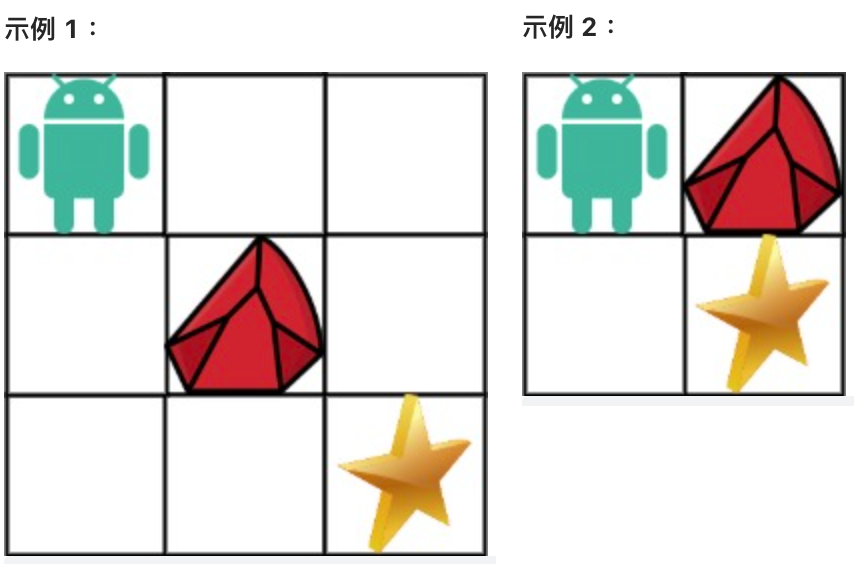

Example 1:

```
Input: obstacleGrid = [[0,0,0],[0,1,0],[0,0,0]]
Output: 2
Explanation: There is one obstacle in the middle of the 3x3 grid above.
There are two ways to reach the bottom-right corner:
1. Right -> Right -> Down -> Down
2. Down -> Down -> Right -> Right
```

解释：3x3 网格的正中间有一个障碍物。
从左上角到右下角一共有 2 条不同的路径：
1. 向右 -> 向右 -> 向下 -> 向下
2. 向下 -> 向下 -> 向右 -> 向右


Example 2:

```
Input: obstacleGrid = [[0,1],[0,0]]
Output: 1
```


Constraints:

- m == obstacleGrid.length
- n == obstacleGrid[i].length
- 1 <= m, n <= 100
- obstacleGrid[i][j] is 0 or 1.



## 解题思路

- 一个机器人位于一个 m x n 网格的左上角 （起始点在下图中标记为“Start” ）。机器人每次只能向下或者向右移动一步。机器人试图达到网格的右下角（在下图中标记为“Finish”）。现在考虑网格中有障碍物。那么从左上角到右下角将会有多少条不同的路径？

- 这一题是第 62 题的加强版。也是一道考察 DP 的简单题。

- 这一题比第 62 题增加的条件是地图中会出现障碍物，障碍物的处理方法是 dp[i][j]=0。

- 需要注意的一种情况是，起点就是障碍物，那么这种情况直接输出 0 。

In [18]:
class Solution(object):
    def uniquePathsWithObstacles(self, obstacleGrid):
        m, n = len(obstacleGrid), len(obstacleGrid[0])
        dp = [[0 for _ in range(n)] for _ in range(m)]

        if obstacleGrid[0][0] == 1 or obstacleGrid[m-1][n-1] == 1: 
            return 0
        dp[0][0] = 1
        for index in range(1, m):
            if obstacleGrid[index][0] == 1:
                dp[index][0] = 0
            else:
                dp[index][0] = dp[index-1][0]
        for index in range(1, n):
            if obstacleGrid[0][index] == 1:
                dp[0][index] = 0
            else:
                dp[0][index] = dp[0][index-1]
        for index_i in range(1, m):
            for index_j in range(1, n):
                if obstacleGrid[index_i][index_j] == 1:
                    dp[index_i][index_j] = 0
                else:
                    dp[index_i][index_j] = dp[index_i-1][index_j] + dp[index_i][index_j-1] 
        return dp[m-1][n-1]

##  LeetCode 300. Longest Increasing Subsequence 最长递增子序列

Given an integer array nums, return the length of the longest strictly increasing subsequence.

A subsequence is a sequence that can be derived from an array by deleting some or no elements without changing the order of the remaining elements. For example, [3,6,2,7] is a subsequence of the array [0,3,1,6,2,2,7].


给你一个整数数组 nums ，找到其中最长严格递增子序列的长度。

子序列 是由数组派生而来的序列，删除（或不删除）数组中的元素而不改变其余元素的顺序。例如，[3,6,2,7] 是数组 [0,3,1,6,2,2,7] 的子序列。


Example 1:

```
Input: nums = [10,9,2,5,3,7,101,18]
Output: 4
Explanation: The longest increasing subsequence is [2,3,7,101], therefore the length is 4.

```

最长递增子序列是 [2,3,7,101]，因此长度为 4 。

Example 2:

```
Input: nums = [0,1,0,3,2,3]
Output: 4
```


Example 3:

```
Input: nums = [7,7,7,7,7,7,7]
Output: 1
```


Constraints:

- $1 <= nums.length <= 2500$

- $10^4 <= nums[i] <= 10^4$

Follow up: Can you come up with an algorithm that runs in O(n log(n)) time complexity?

你能将算法的时间复杂度降低到 O(n log(n)) 吗?

## Tip

你能将算法的时间复杂度降低到 O(n log(n)) 吗?  ... 利用二叉搜索


## Reference

https://books.halfrost.com/leetcode/ChapterFour/0300~0399/0300.Longest-Increasing-Subsequence/

## 定义状态函数 :

dp[i] 表示包含第 i 个元素的最大上升子序列的长度。

$$
\begin{gathered}
\operatorname{nums}=[10,9,2,5,3,7,101,18] \\
d p=[1,1,1,2,2,3,4,4] \\
\end{gathered}
$$

## 状态转移方程 :

$$
\begin{gathered}
d p[i]=\max _{0 \leq j<i}\{d p[j]+1,1\}, \text { if nums }[i]>\text { nums }[j] \\
\end{gathered}
$$

## 最终结果 :

$$
\begin{gathered}
\max _{i}\{d p[i]\}
\end{gathered}
$$

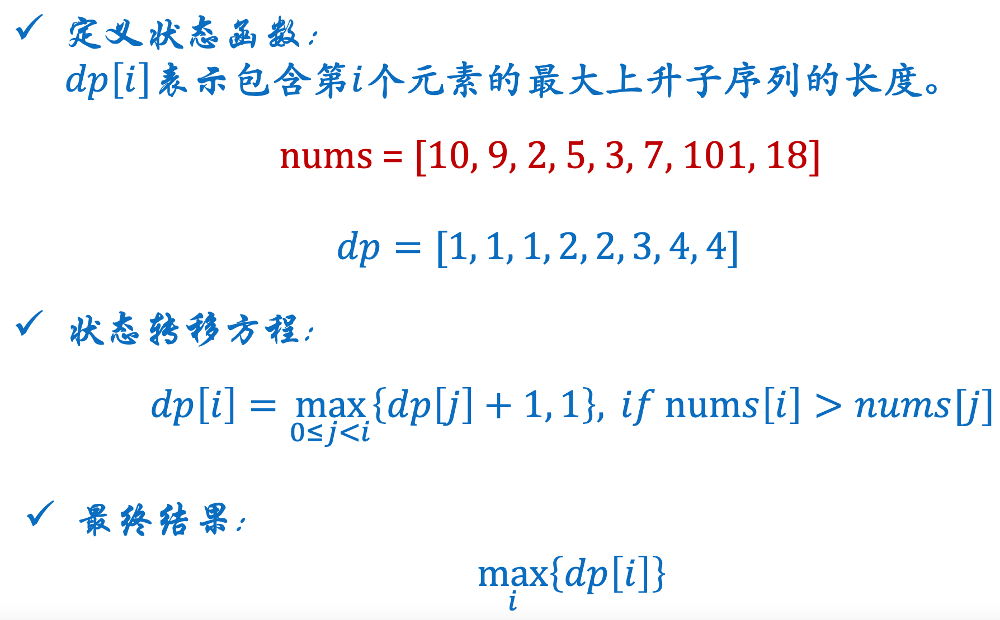

In [19]:
class Solution(object):
    def lengthOfLIS(self, nums):
        if not nums:
            return 0
        N = len(nums)
        dp = [1 for _ in range(N)]
        ans = 1
        for i in range(1, N):
            temp = []
            temp.append(1)
            for j in range(i):
                if nums[i] > nums[j]:
                    temp.append(dp[j] + 1)
            dp[i] = max(temp)
            ans = max(ans, dp[i]) 
        return ans

# Sample 简洁版
class Solution(object):
    def lengthOfLIS(self, nums):
        if not nums:
            return 0
        N = len(nums)
        dp = [1 for _ in range(N)]
        ans = 1
        for i in range(1, N):
            for j in range(i):
                if nums[i] > nums[j]:
                    dp[i] = max(dp[i], dp[j] + 1)
            ans = max(ans, dp[i])
        return ans

## LeetCode 312. Burst Balloons 戳气球

You are given n balloons, indexed from 0 to n - 1. Each balloon is painted with a number on it represented by an array nums. You are asked to burst all the balloons.

If you burst the ith balloon, you will get nums[i - 1] * nums[i] * nums[i + 1] coins. If i - 1 or i + 1 goes out of bounds of the array, then treat it as if there is a balloon with a 1 painted on it.

Return the maximum coins you can collect by bursting the balloons wisely.

有 n 个气球，编号为0 到 n - 1，每个气球上都标有一个数字，这些数字存在数组 nums 中。

现在要求你戳破所有的气球。戳破第 i 个气球，你可以获得 nums[i - 1] * nums[i] * nums[i + 1] 枚硬币。 这里的 i - 1 和 i + 1 代表和 i 相邻的两个气球的序号。如果 i - 1或 i + 1 超出了数组的边界，那么就当它是一个数字为 1 的气球。

求所能获得硬币的最大数量。


Example 1:

```
Input: nums = [3,1,5,8]
Output: 167
Explanation:
nums = [3,1,5,8] --> [3,5,8] --> [3,8] --> [8] --> []
coins =  3*1*5    +   3*5*8   +  1*3*8  + 1*8*1 = 167
```


Example 2:

```
Input: nums = [1,5]
Output: 10
```


Constraints:

- n == nums.length

- 1 <= n <= 300

- 0 <= nums[i] <= 100

In [20]:
from typing import List
def maxCoins(self, nums: List[int]) -> int:
        if len(nums) == 0:
            return 0
        if len(nums) < 2:
            return nums[0]
        nums = [1] + nums + [1]
        dp = [[0] * len(nums) for _ in range(len(nums))]
        for i in range(len(nums) - 1, -1, -1):
            for j in range(i + 2, len(nums)):
                for k in range(i + 1, j):
                    dp[i][j] = max(dp[i][j], dp[i][k] + dp[k][j] + nums[i] * nums[k] * nums[j])
        # print(dp)
        return dp[0][-1]

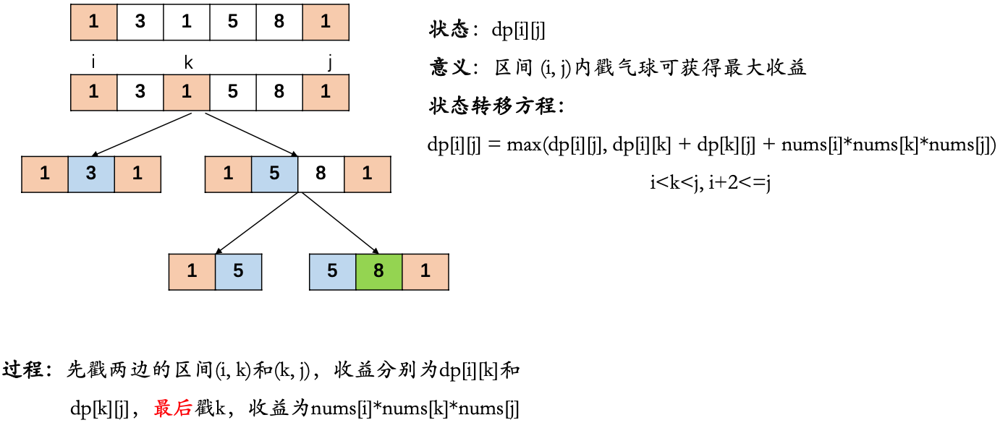

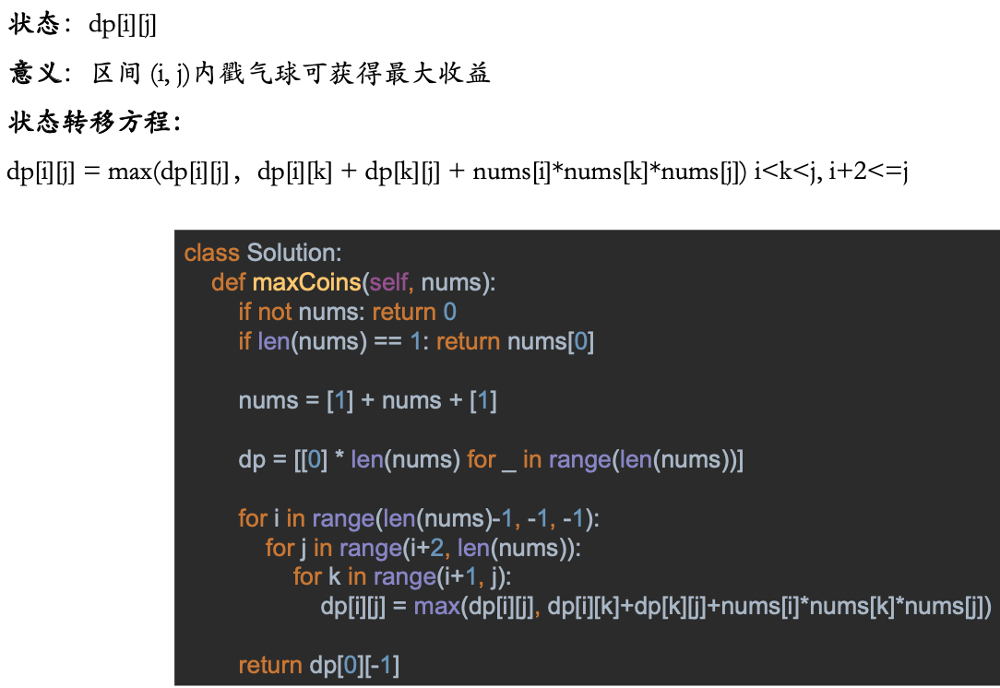

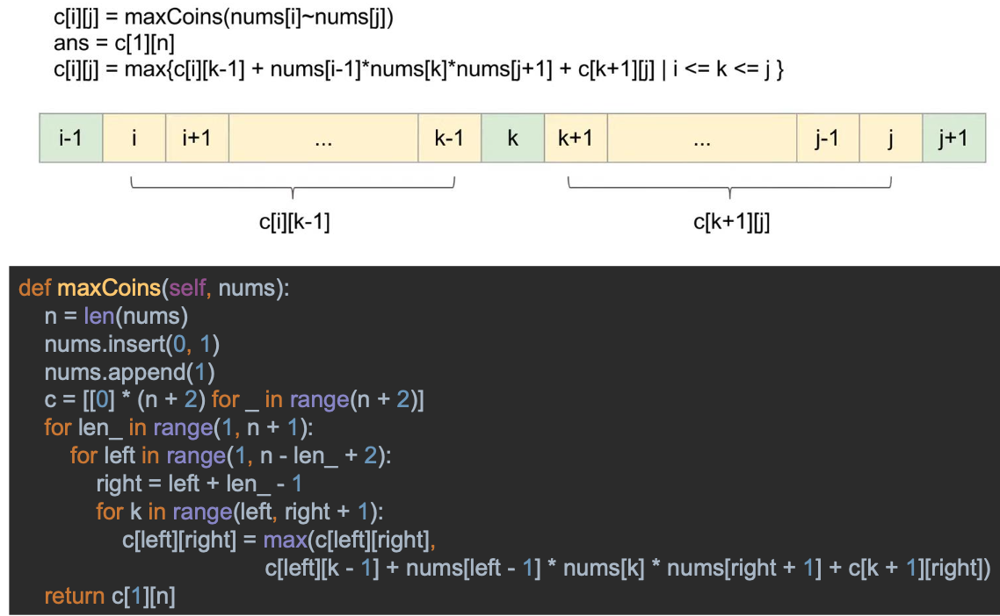

In [21]:
class Solution:
    def maxCoins(self, nums):
        if not nums: return 0
        if len(nums) == 1: return nums[0]
        nums = [1] + nums + [1]
        dp = [[0] * len(nums) for _ in range(len(nums))]
        for i in range(len(nums)-1, -1, -1): 
            for j in range(i+2, len(nums)):
                for k in range(i+1, j):
                    dp[i][j] = max(dp[i][j], dp[i][k]+dp[k][j]+nums[i]*nums[k]*nums[j])
        return dp[0][-1]

class Solution:
    def maxCoins(self, nums): 
        n = len(nums) 
        nums.insert(0, 1)
        nums.append(1)
        c = [[0] * (n + 2) for _ in range(n + 2)]
        for len_ in range(1, n + 1):
            for left in range(1, n - len_ + 2):
                right = left + len_ - 1
                for k in range(left, right + 1):
                    c[left][right] = max(c[left][right], c[left][k - 1] + nums[left - 1] * nums[k] * nums[right + 1] + c[k + 1][right])
        return c[1][n]

# 10. 樹

- 要理解树数据结构的含义以及如何使用。

- 使用列表实现树。

- 使用类和引用来实现树。

- 实现树作为递归数据结构。

- 使用堆实现优先级队列。

## 實例

- 文件系统树

- 网页

- 句子

- 公式解析

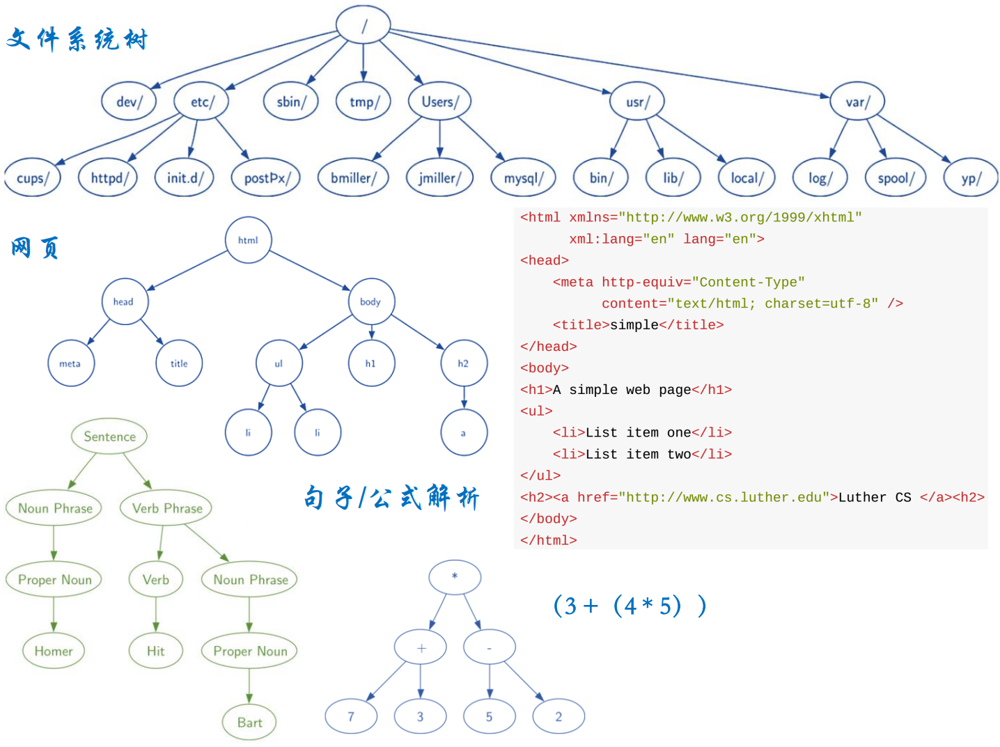

# 16. 樹各名詞定義

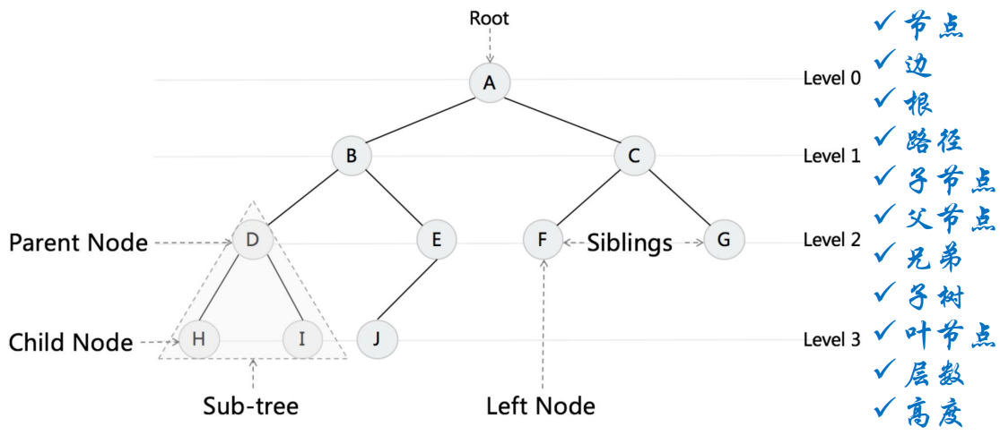

## 定义树（Tree）

定义一：树由一组节点和一组连接节点的边组成。且树具有以下属性：

- 树的一个节点被指定为根节点
- 除了根节点之外，每个节点 n 通过一个其他节点 p 的边连接，其中 p 是 n 的父节点
- 从根路径遍历到每个节点路径唯一
- 如果树中的每个节点最多有两个子节点，我们说该树是一个二叉树

定义二：树是空的，或者由一个根节点和零个或多个子树组成，每个子树也是一棵树。每个子树的根节点通过边连接到父树的根节点。

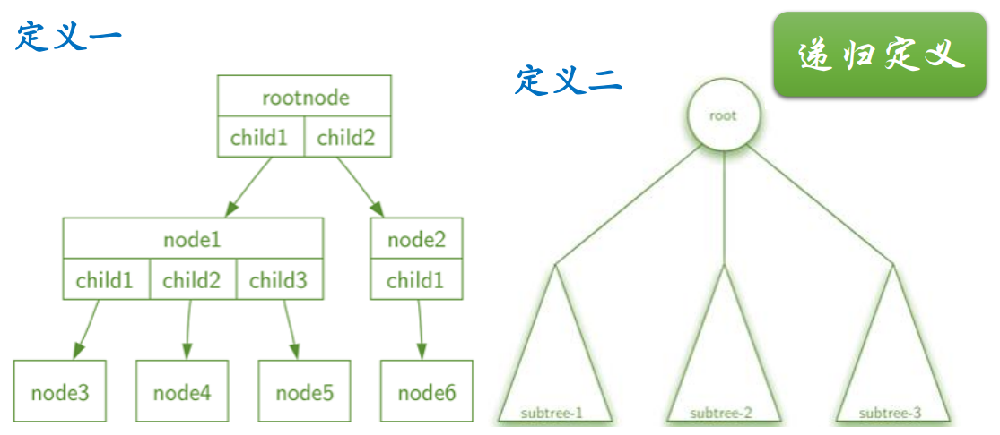

## Know Thy Complexities!

### Reference

https://www.bigocheatsheet.com/

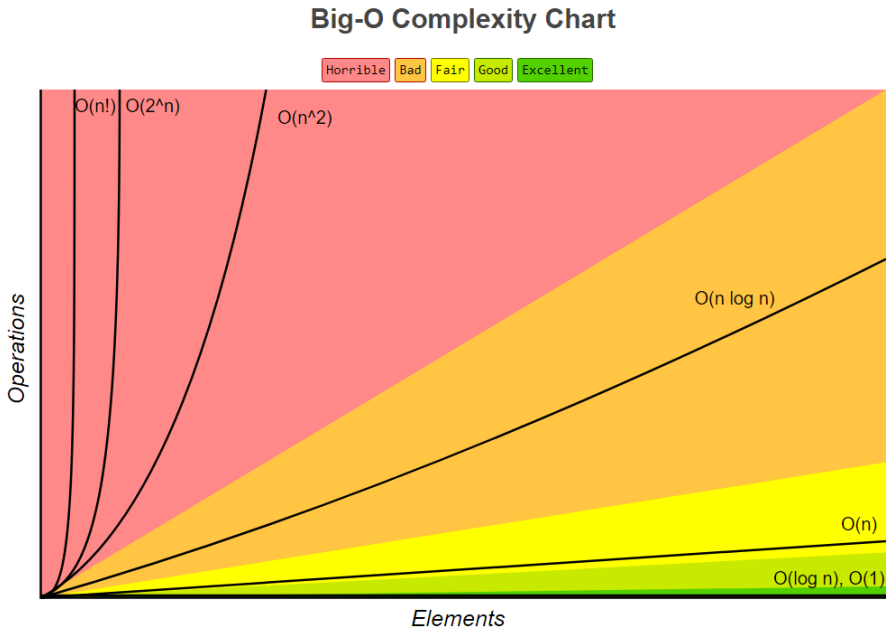

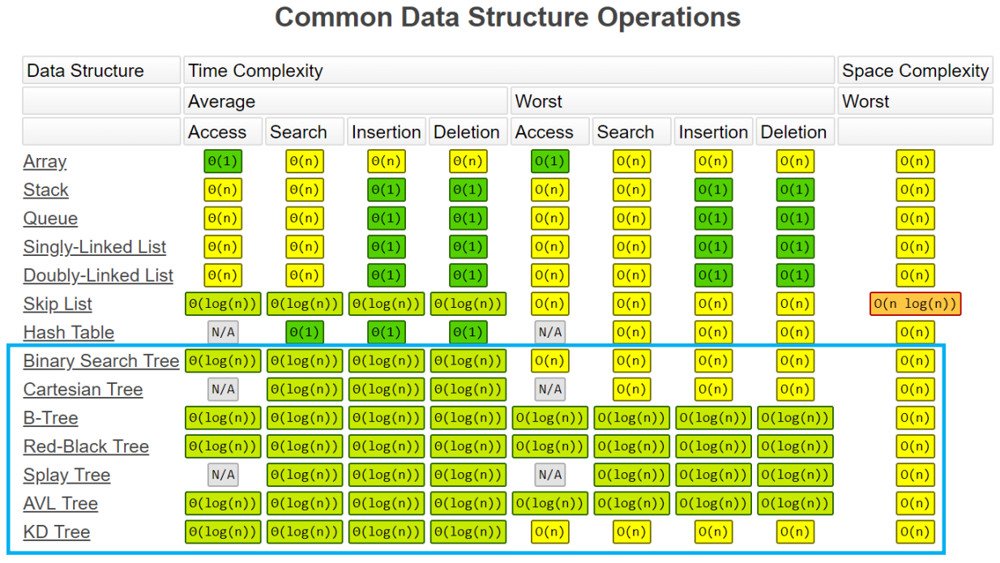

## Binary Tree & Binary Search Tree

- Binary Tree : 基于二叉堆实现优先队列
    
- Binary Search Tree : 二叉查找树

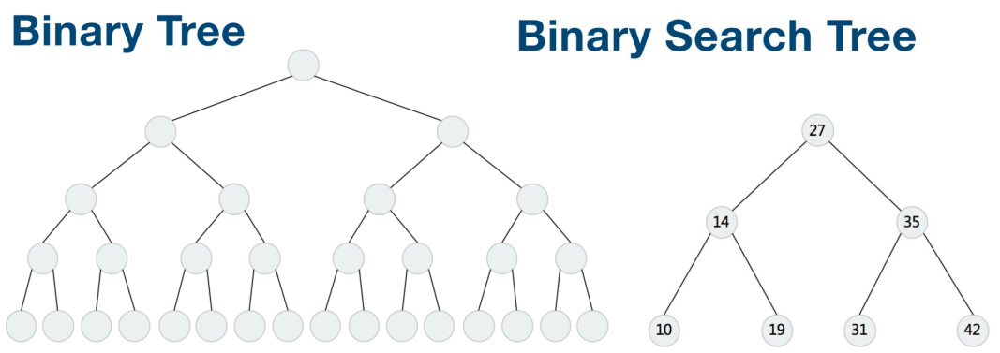

## 树的表示-列表

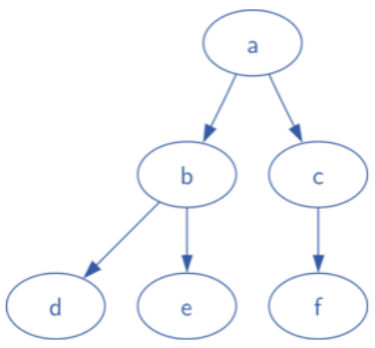
```
myTree = ['a', #root
    ['b', #left subtree
        ['d', [], []],
        ['e', [], []] ],
    ['c', #right subtree
        ['f', [], []],
        [] ]
    ]

print(myTree)
print('left subtree = ', myTree[1])
print('root = ', myTree[0])
print('right subtree = ', myTree[2])
```

In [22]:
myTree = ['a', #root
    ['b', #left subtree
        ['d', [], []],
        ['e', [], []] ],
    ['c', #right subtree
        ['f', [], []],
        [] ]
    ]

print(myTree)
print('left subtree = ', myTree[1])
print('root = ', myTree[0])
print('right subtree = ', myTree[2])

['a', ['b', ['d', [], []], ['e', [], []]], ['c', ['f', [], []], []]]
left subtree =  ['b', ['d', [], []], ['e', [], []]]
root =  a
right subtree =  ['c', ['f', [], []], []]


## 树的表示-列表

In [23]:
def BinaryTree(r):
    return [r, [], []]

def insertLeft(root,newBranch):
    t = root.pop(1)
    if len(t) > 1:
        root.insert(1,[newBranch,t,[]])
    else:
        root.insert(1,[newBranch, [], []])
    return root

def insertRight(root,newBranch):
    t = root.pop(2)
    if len(t) > 1:
        root.insert(2,[newBranch,[],t])
    else:
        root.insert(2,[newBranch,[],[]])
    return root

def getRootVal(root):
    return root[0]

def setRootVal(root,newVal):
    root[0] = newVal

def getLeftChild(root):
    return root[1]

def getRightChild(root):
    return root[2]

r = BinaryTree(3)
insertLeft(r,4)
insertLeft(r,5)
insertRight(r,6)
insertRight(r,7)
l = getLeftChild(r)
print(l)
setRootVal(l,9)
print(r)
insertLeft(l,11)
print(r)
print(getRightChild(getRightChild(r)))

[5, [4, [], []], []]
[3, [9, [4, [], []], []], [7, [], [6, [], []]]]
[3, [9, [11, [4, [], []], []], []], [7, [], [6, [], []]]]
[6, [], []]


## 树的表示-类

```
class BinaryTree:
    def __init__(self,rootObj):
        self.key = rootObj
        self.leftChild = None
        self.rightChild = None
    def insertLeft(self,newNode):
        if self.leftChild == None:
            self.leftChild = BinaryTree(newNode)
        else:
            t = BinaryTree(newNode)
            t.leftChild = self.leftChild
            self.leftChild = t
    def insertRight(self,newNode):
        if self.rightChild == None:
            self.rightChild = BinaryTree(newNode)
        else:
            t = BinaryTree(newNode)
            t.rightChild = self.rightChild
            self.rightChild = t
    def getRightChild(self):
        return self.rightChild
    def getLeftChild(self):
        return self.leftChild
    def setRootVal(self,obj):
        self.key = obj
    def getRootVal(self):
        return self.key
```

In [24]:
class BinaryTree:
    def __init__(self,rootObj):
        self.key = rootObj
        self.leftChild = None
        self.rightChild = None
    def insertLeft(self,newNode):
        if self.leftChild == None:
            self.leftChild = BinaryTree(newNode)
        else:
            t = BinaryTree(newNode)
            t.leftChild = self.leftChild
            self.leftChild = t
    def insertRight(self,newNode):
        if self.rightChild == None:
            self.rightChild = BinaryTree(newNode)
        else:
            t = BinaryTree(newNode)
            t.rightChild = self.rightChild
            self.rightChild = t
    def getRightChild(self):
        return self.rightChild
    def getLeftChild(self):
        return self.leftChild
    def setRootVal(self,obj):
        self.key = obj
    def getRootVal(self):
        return self.key

r = BinaryTree('a')
print(r.getRootVal())
print(r.getLeftChild())
r.insertLeft('b')
print(r.getLeftChild())
print(r.getLeftChild().getRootVal())
r.insertRight('c')
print(r.getRightChild())
print(r.getRightChild().getRootVal())
r.getRightChild().setRootVal('hello')
print(r.getRightChild().getRootVal())

a
None
b
c
hello


## 树和链表

In [25]:
class Node:
    def __init__(self, initdata):
        self.data = initdata
        self.next = None
    def getData(self):
        return self.data
    def getNext(self):
        return self.next
    def setData(self,newdata):
        self.data = newdata
    def setNext(self,newnext):
        self.next = newnext

class BinaryTree:
    def __init__(self,rootObj):
        self.key = rootObj
        self.leftChild = None
        self.rightChild = None
    def insertLeft(self,newNode):
        if self.leftChild == None:
            self.leftChild = BinaryTree(newNode)
        else:
            t = BinaryTree(newNode)
            t.leftChild = self.leftChild
            self.leftChild = t
    def insertRight(self,newNode):
        if self.rightChild == None:
            self.rightChild = BinaryTree(newNode)
        else:
            t = BinaryTree(newNode)
            t.rightChild = self.rightChild
            self.rightChild = t


## 树的遍历(Traversal)

- 1. 前序(Pre-order)：根-左-右

- 2. 中序(In-order)：左-根-右

- 3. 后序(Post-order)：左-右-根

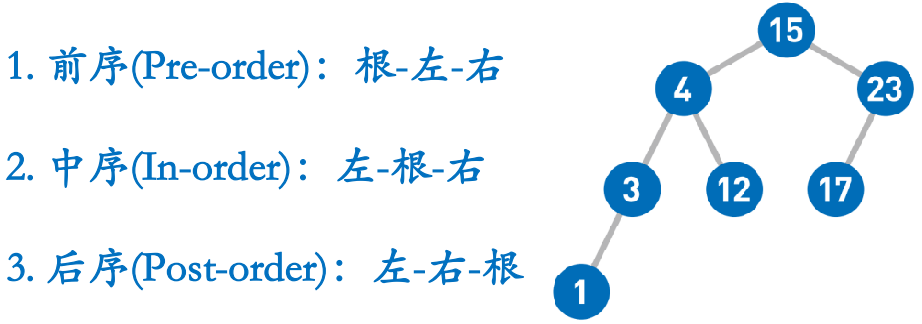

### 說明
```
# Definition for a binary tree node.
class TreeNode:
    def __init__(self, x):
        self.val = x
        self.left = None
        self.right = None
class Solution:
    def hasPathSum(self, root, sum)
        # ... Code ...
        return True or False
if __name__ == '__main__':
    root = TreeNode(5)
    root.left = TreeNode(4)
    root.right = TreeNode(8)
    root.right.left = TreeNode(13)
    root.right.right = TreeNode(4)
    root.right.right.right = TreeNode(1)
    root.left.left = TreeNode(11)
    root.left.left.left = TreeNode(7)
    root.left.left.right = TreeNode(2)
    print(Solution().hasPathSum(root, 22))
```

In [26]:
# Definition for a binary tree node.
class TreeNode:
    def __init__(self, x):
        self.val = x
        self.left = None
        self.right = None

class Solution(object):
    def hasPathSum(self, root, sum):
        if not root:
            return False
        if not root.left and not root.right and root.val == sum:
            return True
        sum -= root.val
        return self.hasPathSum(root.left, sum) or self.hasPathSum(root.right, sum)

if __name__ == '__main__':
    root = TreeNode(5)
    root.left = TreeNode(4)
    root.right = TreeNode(8)
    root.right.left = TreeNode(13)
    root.right.right = TreeNode(4)
    root.right.right.right = TreeNode(1)
    root.left.left = TreeNode(11)
    root.left.left.left = TreeNode(7)
    root.left.left.right = TreeNode(2)
    print(Solution().hasPathSum(root, 22))

True


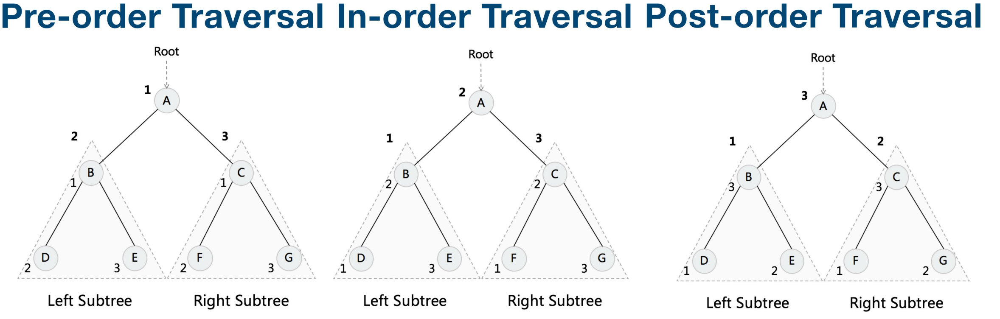

In [27]:
# 树的遍历

def preorder(tree):
    if tree:
        print(tree.getRootVal())
        preorder(tree.getLeftChild())
        preorder(tree.getRightChild())

def postorder(tree):
    if tree != None:
        postorder(tree.getLeftChild())
        postorder(tree.getRightChild())
        print(tree.getRootVal())

def inorder(tree):
    if tree != None:
        inorder(tree.getLeftChild())
        print(tree.getRootVal())
        inorder(tree.getRightChild())

## LeetCode 144. Binary Tree Preorder Traversal 二叉树的前序遍历

Given the root of a binary tree, return the preorder traversal of its nodes' values.

给你二叉树的根节点 root ，返回它节点值的 前序 遍历。

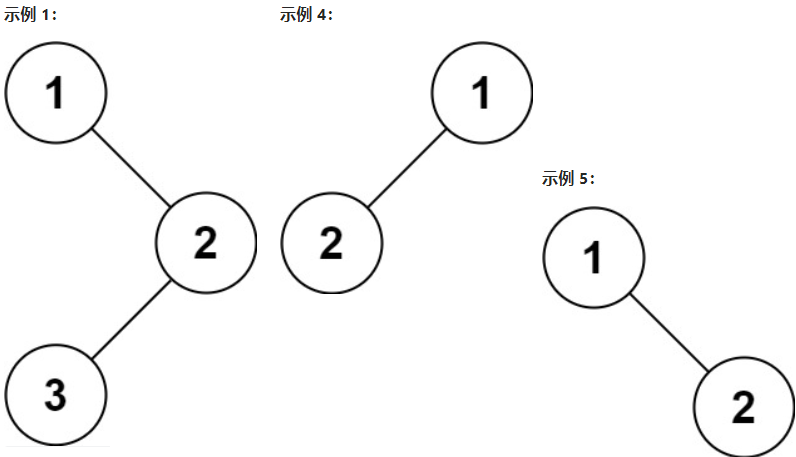

Example 1:

```
Input: root = [1,null,2,3]
Output: [1,2,3]
```


Example 2:

```
Input: root = []
Output: []
```


Example 3:

```
Input: root = [1]
Output: [1]
```

Example 4:

```
输入：root = [1,2]
输出：[1,2]
```

Example 5:

```
输入：root = [1,null,2]
输出：[1,2]
```

Constraints:

- The number of nodes in the tree is in the range [0, 100].

树中节点数目范围在 [0, 100] 内

- -100 <= Node.val <= 100


Follow up: Recursive solution is trivial, could you do it iteratively?

进阶：递归算法很简单，你可以通过迭代算法完成吗？

In [28]:
# Definition for a binary tree node.
class TreeNode:
    def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right
# Python 迭代
class Solution(object):
    def preorderTraversal(self, root):
        if not root:
            return []
        
        stack = [root]
        res = []
        while stack:
            cur = stack.pop()
            res.append(cur.val)            
            if cur.right:
                stack.append(cur.right)
            if cur.left:
                stack.append(cur.left)
        return res

# Python 递归
class Solution(object):
    def preorderTraversal(self, root):
        if not root:
            return []
        return [root.val] + self.preorderTraversal(root.left) + self.preorderTraversal(root.right)

## 說明

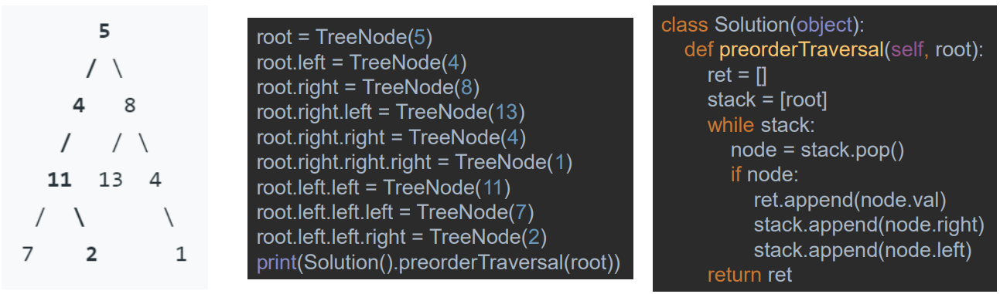

In [29]:
# Definition for a binary tree node.
class TreeNode:
    def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right

class Solution(object):
    def preorderTraversal(self, root):
        ret = []
        stack = [root]
        while stack:
            node = stack.pop()
            if node:
                ret.append(node.val)
                stack.append(node.right)
                stack.append(node.left)
        return ret

root = TreeNode(5)
root.left = TreeNode(4)
root.right = TreeNode(8)
root.right.left = TreeNode(13)
root.right.right = TreeNode(4)
root.right.right.right = TreeNode(1)
root.left.left = TreeNode(11)
root.left.left.left = TreeNode(7)
root.left.left.right = TreeNode(2)
print(Solution().preorderTraversal(root))

[5, 4, 11, 7, 2, 8, 13, 4, 1]


## LeetCode 105. Construct Binary Tree from Preorder and Inorder Traversal 从前序与中序遍历序列构造二叉树

Given two integer arrays preorder and inorder where preorder is the preorder traversal of a binary tree and inorder is the inorder traversal of the same tree, construct and return the binary tree.

给定两个整数数组 preorder 和 inorder ，其中 preorder 是二叉树的先序遍历， inorder 是同一棵树的中序遍历，请构造二叉树并返回其根节点。


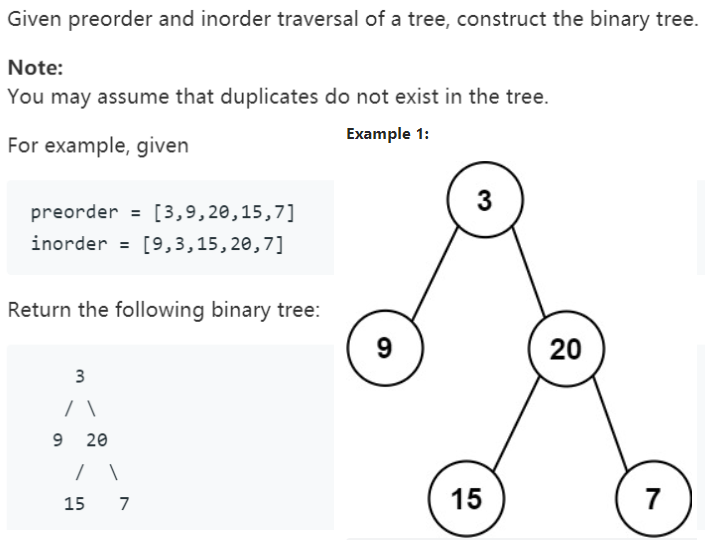

Example 1:

```
Input: preorder = [3,9,20,15,7], inorder = [9,3,15,20,7]
Output: [3,9,20,null,null,15,7]
```


Example 2:

```
Input: preorder = [-1], inorder = [-1]
Output: [-1]
```


Constraints:

- 1 <= preorder.length <= 3000

- inorder.length == preorder.length

- -3000 <= preorder[i], inorder[i] <= 3000

- preorder and inorder consist of unique values.

preorder 和 inorder 均 无重复 元素

- Each value of inorder also appears in preorder.

inorder 均出现在 preorder

- preorder is guaranteed to be the preorder traversal of the tree.

preorder 保证 为二叉树的前序遍历序列

- inorder is guaranteed to be the inorder traversal of the tree.

inorder 保证 为二叉树的中序遍历序列


In [30]:
# Definition for a binary tree node.
class TreeNode:
    def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right
class Solution:
    def buildTree(self, preorder: List[int], inorder: List[int]) -> TreeNode:
        dic = {}
        for idx,i in enumerate(inorder):
            dic[i] = idx

        def dfs(pre_left,ino_l,ino_r):
            if pre_left>=len(preorder) or ino_l> ino_r or ino_r>=len(inorder) or ino_l<0 or ino_r<0: return None
            node = TreeNode(preorder[pre_left])
            mid = dic[preorder[pre_left]]
           # print(mid)
            pre_left = pre_left 
            node.left = dfs(pre_left + 1,ino_l,mid-1)
            node.right = dfs(pre_left + (mid - ino_l+1), mid+1, ino_r )
            return node
        return dfs(0,0,len(inorder)-1)

### Reference

https://www.youtube.com/watch?v=GeltTz3Z1rw


### LC 105 說明

```

# Definition for a binary tree node.
class TreeNode:
    def __init__(self, x):
        self.val = x
        self.left = None
        self.right = None
class Solution(object):
    def buildTree(self, preorder, inorder):
        # ... Code ...
        return root
preorder = [3,9,20,15,7]
inorder = [9,3,15,20,7]
root = Solution().buildTree(preorder, inorder)

```

前序遍历：遍历顺序为 父节点 -> 左子节点 -> 右子节点

中序遍历：遍历顺序为 左子节点 -> 父节点 -> 右子节点

前序遍历的第一个元素为根节点，而在中序遍历中，该根节点所在位置的左侧为左子树，右侧为右子树。

In [31]:
# Definition for a binary tree node.
class TreeNode:
    def __init__(self, x):
        self.val = x
        self.left = None
        self.right = None
class Solution(object):
    def buildTree(self, preorder, inorder):
        if len(inorder) == 0:
            return None
        # 前序遍历第一个值为根节点
        root = TreeNode(preorder[0])
        # 因为没有重复元素，所以可以直接根据值来查找根节点在中序遍历中的位置
        mid = inorder.index(preorder[0])
        # 构建左子树
        root.left = self.buildTree(preorder[1:mid + 1], inorder[:mid])
        # 构建右子树
        root.right = self.buildTree(preorder[mid + 1:], inorder[mid + 1:])
        return root
preorder = [3,9,20,15,7]
inorder = [9,3,15,20,7]
root = Solution().buildTree(preorder, inorder)

## 分析树 (Parse Tree)

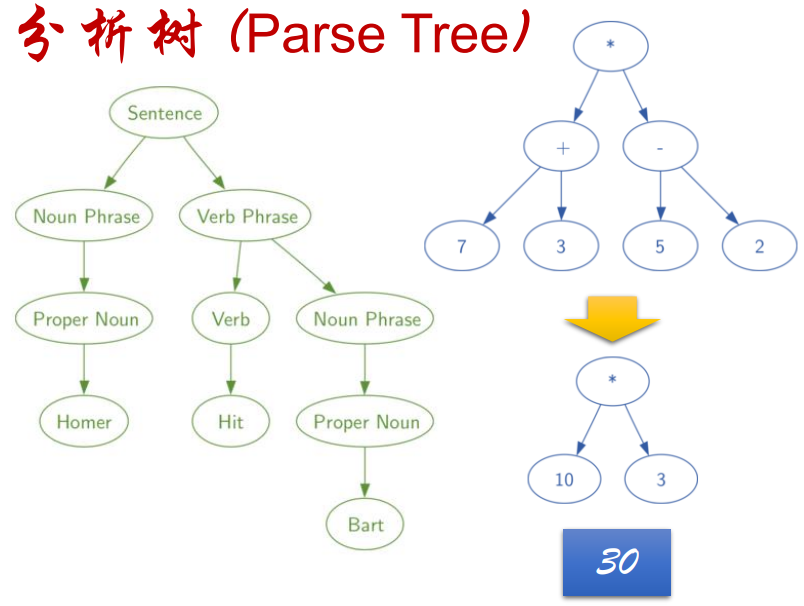

### 构建分析树： （3 +（4 * 5））

四种不同的符号要考虑：左括号，右括号，运算符和操作数


### 定义四个规则如下：

1. 如果当前符号是 '('，添加一个新节点作为当前节点的左子节点，并下降到左子节点。

2. 如果当前符号在列表 ['+'，' - '，'/'，'*'] 中，请将当前节点的根值设置为由当前符号表示的运算符。 添加一个新节点作为当前节点的右子节点，并下降到右子节点。

3. 如果当前符号是数字，请将当前节点的根值设置为该数字并返回到父节点。

4. 如果当前符号是 ')'，则转到当前节点的父节点。

## 分析树 (Parse Tree)流程

### 构建分析树

```
['('，'3'，'+'，'('，'4'，'*'，'5'，')'，')']
```

1. 创建一个空树。

2. 读取 ( 作为第一个标记。按规则1，创建一个新节点作为根的左子节点。使当前节点到这个新子节点。

3. 读取 3 作为下一个符号。按照规则3，将当前节点的根值设置为3，使当前节点返回到父节点。

4. 读取 + 作为下一个符号。根据规则2，将当前节点的根值设置为+，并添加一个新节点作为右子节点。新的右子节点成为当前节点。

5. 读取 ( 作为下一个符号，按规则1，创建一个新节点作为当前节点的左子节点，新的左子节点成为当前节点。

6. 读取 4 作为下一个符号。根据规则3，将当前节点的值设置为 4。使当前节点返回到父节点。
7. 读取 * 作为下一个符号。根据规则2，将当前节点的根值设置为 *，并创建一个新的右子节点。新的右子节点成为当前节点。

8. 读取 5 作为下一个符号。根据规则3，将当前节点的根值设置为5。使当前节点返回到父节点。

9. 读取 ) 作为下一个符号。根据规则4，当前节点返回到父节点。

10. 读取 ) 作为下一个符号。根据规则4，当前节点返回到父节点 + 。没有+的父节点，完成创建。


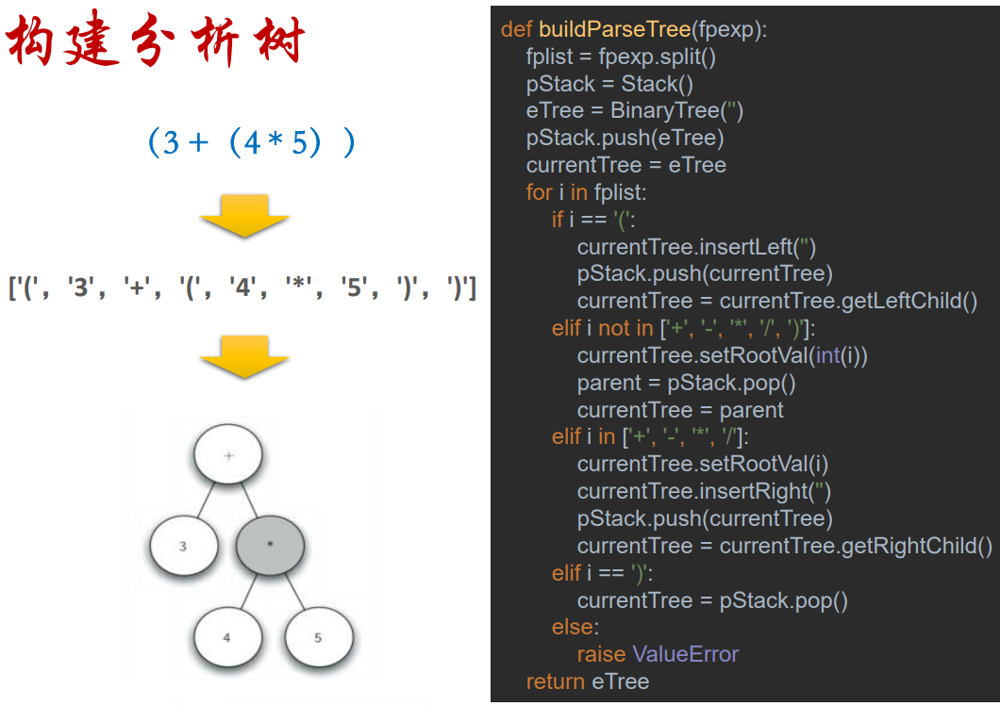

In [32]:
def buildParseTree(fpexp):
    fplist = fpexp.split()
    pStack = Stack()
    eTree = BinaryTree('')
    pStack.push(eTree)
    currentTree = eTree
    for i in fplist:
        if i == '(':
            currentTree.insertLeft('')
            pStack.push(currentTree)
            currentTree = currentTree.getLeftChild()
        elif i not in ['+', '-', '*', '/', ')']:
            currentTree.setRootVal(int(i))
            parent = pStack.pop()
            currentTree = parent
        elif i in ['+', '-', '*', '/']:
            currentTree.setRootVal(i)
            currentTree.insertRight('')
            pStack.push(currentTree)
            currentTree = currentTree.getRightChild()
        elif i == ')':
            currentTree = pStack.pop()
        else:
            raise ValueError
    return eTree

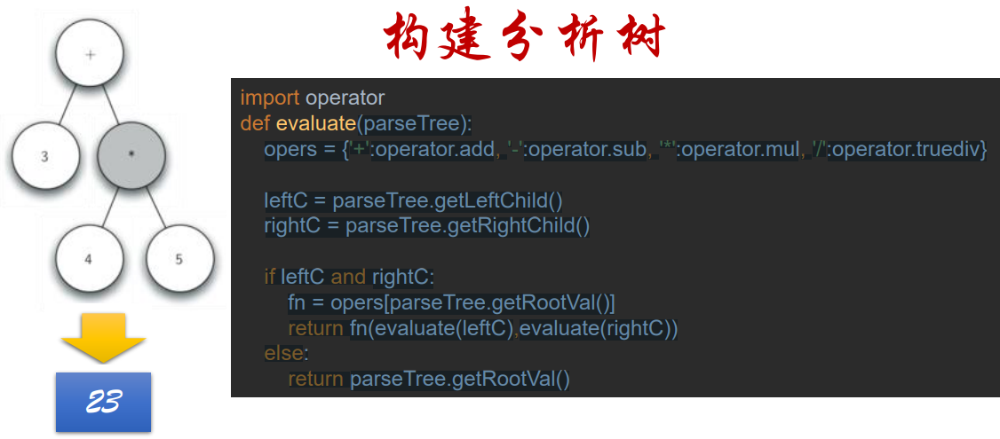

In [33]:
import operator
def evaluate(parseTree):
    opers = {'+':operator.add, '-':operator.sub, '*':operator.mul, '/':operator.truediv}
    leftC = parseTree.getLeftChild()
    rightC = parseTree.getRightChild()
    if leftC and rightC:
        fn = opers[parseTree.getRootVal()]
        return fn(evaluate(leftC),evaluate(rightC))
    else:
        return parseTree.getRootVal()

## Binary Tree & Binary Search Tree

- Binary Tree : 基于二叉堆实现优先队列
    
- Binary Search Tree : 二叉查找树

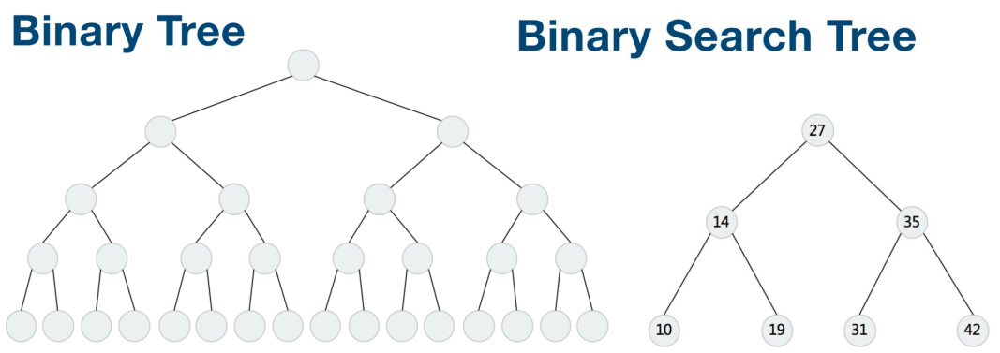

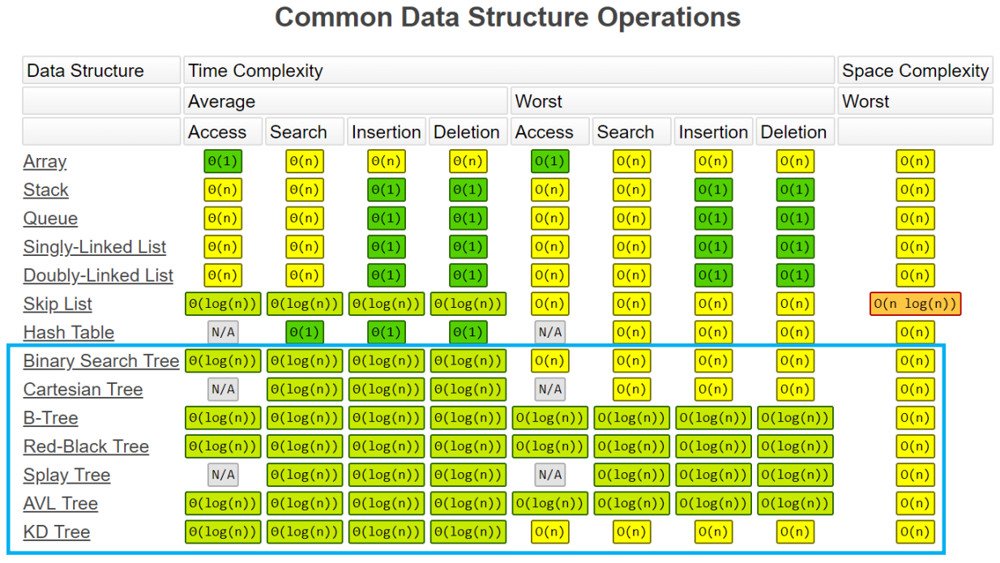

设计一个找到数据流中第K大元素的类 (class)。注意是排序后的第 K 大元素，不是第 K 个不同的元素。你的 KthLargest 类需要一个同时接收整数 k 和整数数组 nums 的构造器，它包含数据流中的初始元素。
每次调用 KthLargest.add，返回当前数据流中第 K 大的元素。

示例 :

```
int k = 3;
int[] arr = [4,5,8,2];
KthLargest kthLargest = new KthLargest(3, arr);
kthLargest.add(3); // returns 4
kthLargest.add(5); // returns 5
kthLargest.add(10); // returns 5
kthLargest.add(9); // returns 8
```

说明: 你可以假设 nums 的长度 ≥ k-1 且k ≥ 1。

## LeetCode 235. Lowest Common Ancestor of a Binary Search Tree 二叉搜索树的最近公共祖先

Given a binary search tree (BST), find the lowest common ancestor (LCA) of two given nodes in the BST.

According to the definition of LCA on Wikipedia: “The lowest common ancestor is defined between two nodes p and q as the lowest node in T that has both p and q as descendants (where we allow a node to be a descendant of itself).”

给定一个二叉搜索树, 找到该树中两个指定节点的最近公共祖先。

百度百科中最近公共祖先的定义为：“对于有根树 T 的两个结点 p、q，最近公共祖先表示为一个结点 x，满足 x 是 p、q 的祖先且 x 的深度尽可能大（一个节点也可以是它自己的祖先）。”

例如，给定如下二叉搜索树:  root = [6,2,8,0,4,7,9,null,null,3,5]

https://baike.baidu.com/item/%E6%9C%80%E8%BF%91%E5%85%AC%E5%85%B1%E7%A5%96%E5%85%88/8918834

https://en.wikipedia.org/wiki/Lowest_common_ancestor

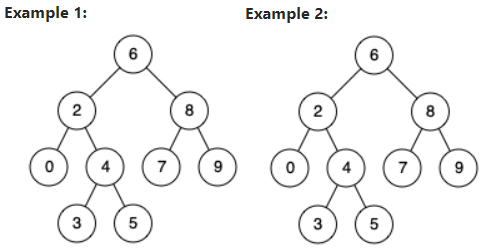

Example 1:

```
Input: root = [6,2,8,0,4,7,9,null,null,3,5], p = 2, q = 8
Output: 6
Explanation: The LCA of nodes 2 and 8 is 6.
节点 2 和节点 8 的最近公共祖先是 6。
```

Example 2:

```
Input: root = [6,2,8,0,4,7,9,null,null,3,5], p = 2, q = 4
Output: 2
Explanation: The LCA of nodes 2 and 4 is 2, since a node can be a descendant of itself according to the LCA definition.
节点 2 和节点 4 的最近公共祖先是 2, 因为根据定义最近公共祖先节点可以为节点本身。
```

Example 3:

```
Input: root = [2,1], p = 2, q = 1
Output: 2
```

Constraints:

- The number of nodes in the tree is in the range $[2, 10^{5}]$.

- $-109$ <= Node.val <= $10^{9}$

- All Node.val are unique.

- p != q

- p and q will exist in the BST.

- 所有节点的值都是唯一的。

- p、q 为不同节点且均存在于给定的二叉搜索树中。



## 解题思路

1. 在二叉搜索树中求两个节点的最近公共祖先，由于二叉搜索树的特殊性质，所以找任意两个节点的最近公共祖先非常简单。

2. python3 利用二叉搜索树的特点，如果p、q的值都小于root，说明p q 肯定在root的左子树中；如果p q都大于root，说明肯定在root的右子树中，如果一个在左一个在右 则说明此时的root记为对应的最近公共祖先

In [34]:
class Solution(object):
    def lowestCommonAncestor(self, root, p, q):
        """
        :type root: TreeNode
        :type p: TreeNode
        :type q: TreeNode
        :rtype: TreeNode
        """
        if p.val<root.val and q.val<root.val:
            return self.lowestCommonAncestor(root.left,p,q)
        if p.val>root.val and q.val>root.val:
            return self.lowestCommonAncestor(root.right,p,q)

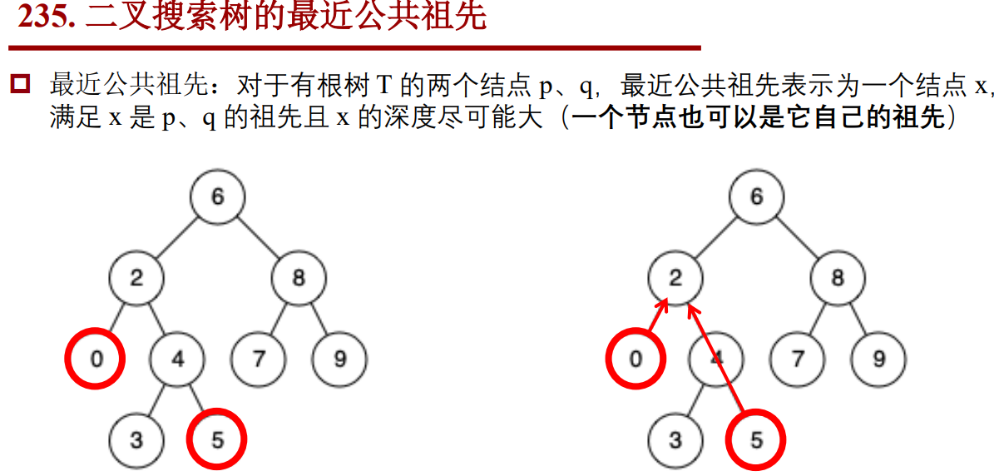

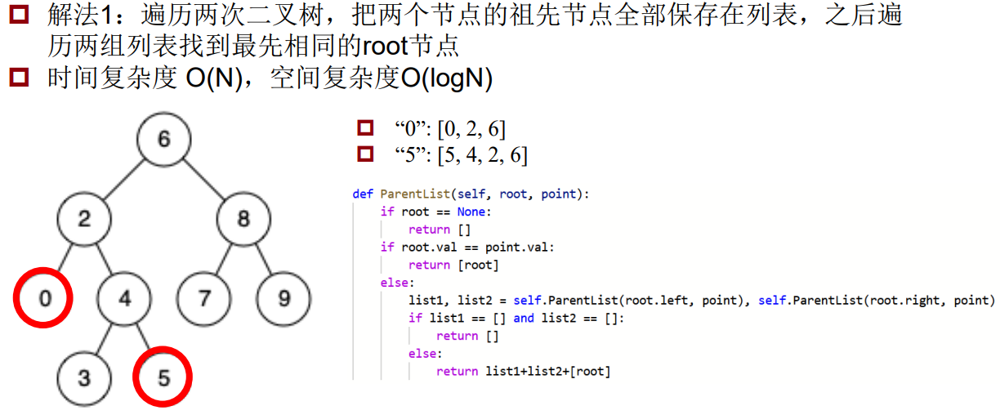

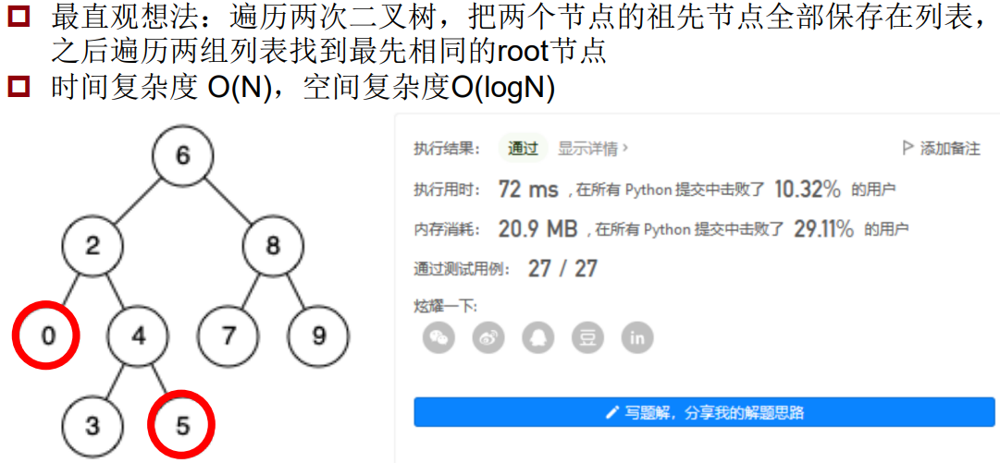

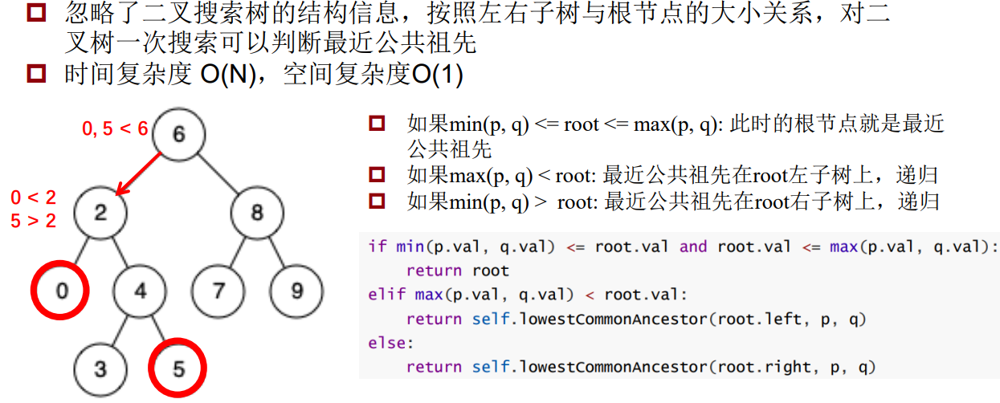

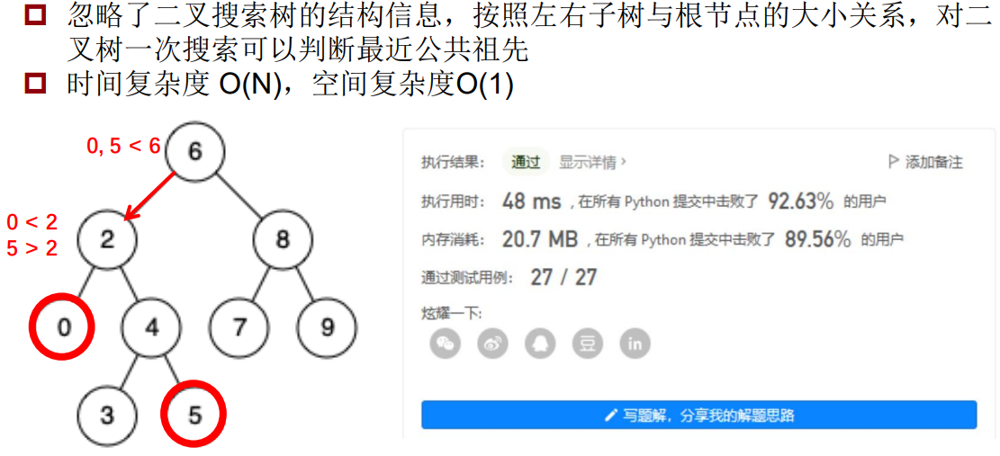

In [35]:
def ParentList(self, root, point):
    if root == None:
        return []
    if root.val == point.val:
        return [root]
    else:
        list1,list2 = self.ParentList(root.left, point), self.ParentList(root.right, point)
        if list1 == [] and list2 == []:
            return []
        else:
            return list1+list2+[root]

```
if min(p.val, q.val) <= root.val and root.val <=max(p.val, q.val):
    return root
elif max(p.val, q.val) < root.val:
    return se1f.1owestCommonAncestor(root.1eft, p, q)
else:
    return se1f.1owestCommonAncestor(root.right, p, q)
```

## LeetCode 110. Balanced Binary Tree 平衡二叉树

Given a binary tree, determine if it is height-balanced.

For this problem, a height-balanced binary tree is defined as:

a binary tree in which the left and right subtrees of every node differ in height by no more than 1.

给定一个二叉树，判断它是否是高度平衡的二叉树。

本题中，一棵高度平衡二叉树定义为：

一个二叉树每个节点 的左右两个子树的高度差的绝对值不超过 1 。

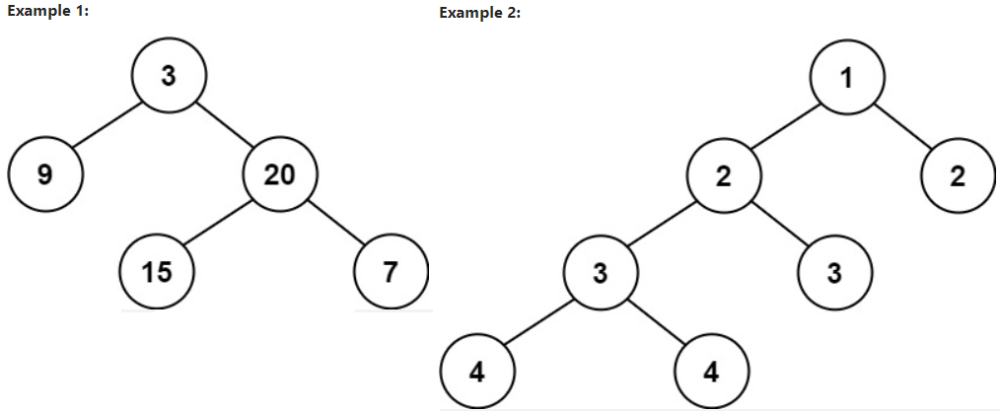

Example 1:

```
Input: root = [3,9,20,null,null,15,7]
Output: true
```

Example 2:

```
Input: root = [1,2,2,3,3,null,null,4,4]
Output: false
```

Example 3:

```
Input: root = []
Output: true
```

Constraints:

- The number of nodes in the tree is in the range [0, 5000].

- $-10^{4} <= Node.val <= 10^{4}$

- 树中的节点数在范围 [0, 5000] 内


## 解题思路

https://books.halfrost.com/leetcode/ChapterFour/0100~0199/0110.Balanced-Binary-Tree/

In [36]:
# Definition for a binary tree node.
class TreeNode:
     def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right
class Solution:
    def isBalanced(self, root: TreeNode) -> bool:
        self.res = True
        def traverse(root):
            if not root:return 0
            if not self.res:return 0
            a = 1+traverse(root.left)
            b = 1+traverse(root.right)
            if abs(a-b) > 1:self.res = False
            return max(a,b)
        traverse(root)
        return self.res

## 說明

一个二叉树每个节点 的左右两个子树的高度差的绝对值不超过 1 。

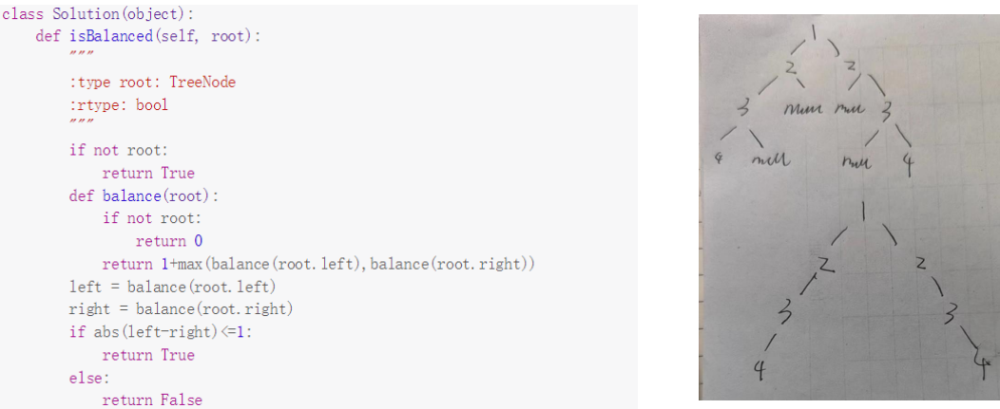

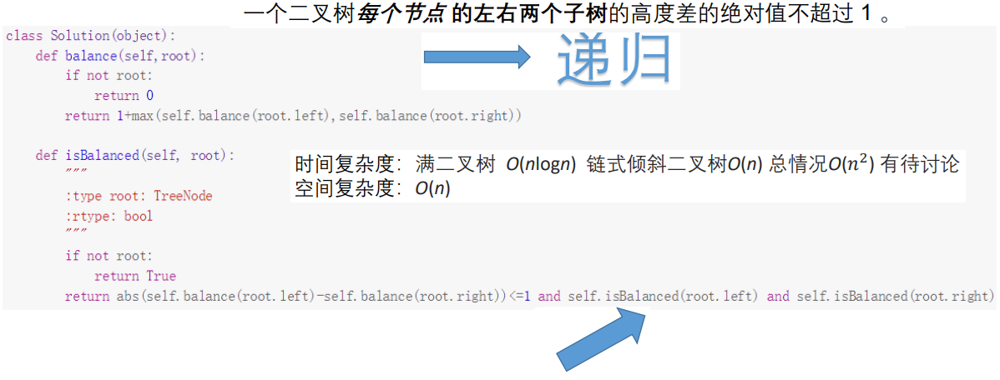

In [37]:
class Solution(object):
    def isBalanced(self, root):
        if not root:
            return True
        def balance(root):
            if not root:
                return 0
            return 1 + max(balance (root.left), balance(root.right))
        left = balance (root.left)
        right = balance(root.right)
        if abs(left-right) <= 1:
            return True
        else:
            return False

In [38]:
class Solution(object):
    def balance(self,root):
        if not root:
            return 0
        return 1+max(self.balance (root.left), self.balance (root. right))
    def isBalanced(self, root):

        if not root:
            return True
        return abs(self.balance(root.left)-self.balance(root.right)) <=1 and self.isBalanced(root.left) and self.isBalanced(root.right)


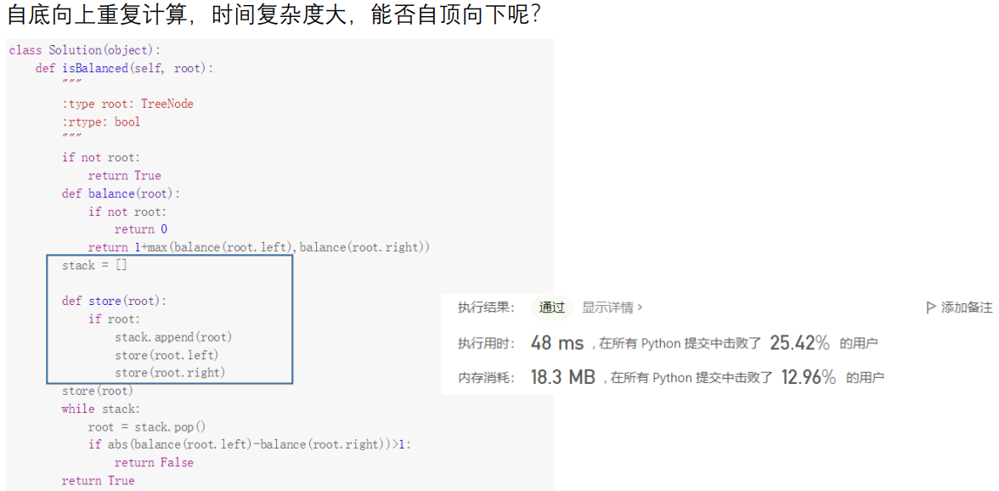

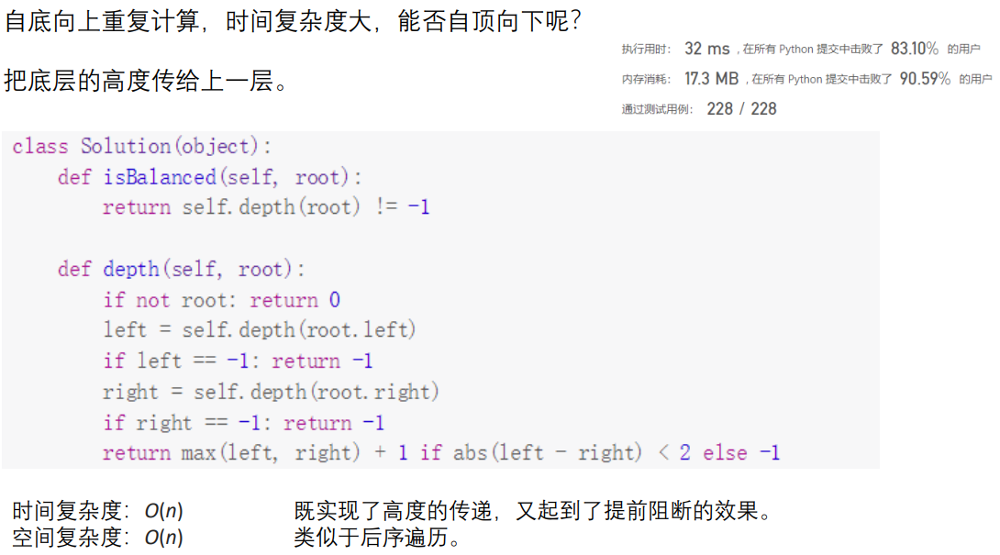

In [39]:
class Solution(object):
    def isBalanced(self, root):
        if not root:
            return True
        def balance(root):
            if not root:
                return 0
            return 1+max(balance(root.left),balance(root.right))
        stack = []
        def store (root):
            if root:
                stack.append(root)
                store(root.left)
                store(root.right)
        store(root)
        while stack:
            root = stack.pop()
            if abs (balance (root.left)-balance (root.right))>1:
                return False
        return True

In [40]:
class Solution(object):
    def isBalanced(self, root):
        return self.depth(root) != -1
    def depth(self, root):
        if not root: return O
        left = self.depth(root.left)
        if left == -1: return -1
        right = self.depth(root.right)
        if right == -1: return -1
        return max(left, right) + 1 if abs(left - right) < 2 else -1

## LeetCode 257. Binary Tree Paths 二叉树的所有路径

Given the root of a binary tree, return all root-to-leaf paths in any order.

A leaf is a node with no children.

给你一个二叉树的根节点 root ，按 任意顺序 ，返回所有从根节点到叶子节点的路径。

叶子节点 是指没有子节点的节点。

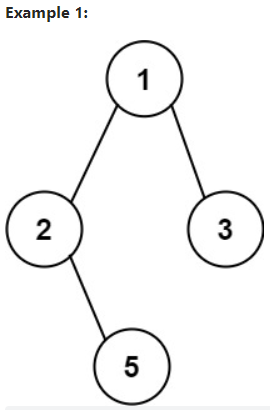

Example 1:

```
Input: root = [1,2,3,null,5]
Output: ["1->2->5","1->3"]
```

Example 2:

```
Input: root = [1]
Output: ["1"]
```

Constraints:

- The number of nodes in the tree is in the range [1, 100].

- 树中节点的数目在范围 [1, 100] 内

- 100 <= Node.val <= 100


## 解题思路

双队列：双入双飞，一个遍历结点，一个跟踪结点行走路径（累加）

P.S: Google 的面试题，考察递归


In [41]:
# Definition for a binary tree node.
from typing import Optional
from typing import List
class TreeNode:
    def __init__(self, val=0, left=None, right=None):
        self.val = val
        self.left = left
        self.right = right
class Solution:
    def binaryTreePaths(self, root: Optional[TreeNode]) -> List[str]:
        if not root:return list()
        q1 = [root]
        q2 = [str(root.val)]
        ans = []
        while q1:
            node = q1.pop(0)  #双飞  #遍历所有结点，O(N)
            s = q2.pop(0)
            if not node.left and not node.right: #遇到叶子节点，就放入ans
                ans.append(s)
            if node.left:
                q1.append(node.left) # 双入
                q2.append(''.join([s,'->',str(node.left.val)]))
            if node.right:
                q1.append(node.right)
                q2.append(''.join([s,'->',str(node.right.val)]))
        return ans

# 17.基于二叉堆实现优先队列

## 优先队列

- 普通的队列是一种先进先出的数据结构，元素在队列尾追加，而从队列头删除。

- 在优先队列中，元素被赋予优先级。当访问元素时，具有最高优先级的元素最先删除。

## 优先队列不再遵循先入先出的原则，而是分为两种情况：

- 最大优先队列，无论入队顺序，当前最大的元素优先出队。

- 最小优先队列，无论入队顺序，当前最小的元素优先出队。

## 最小优先队列例子

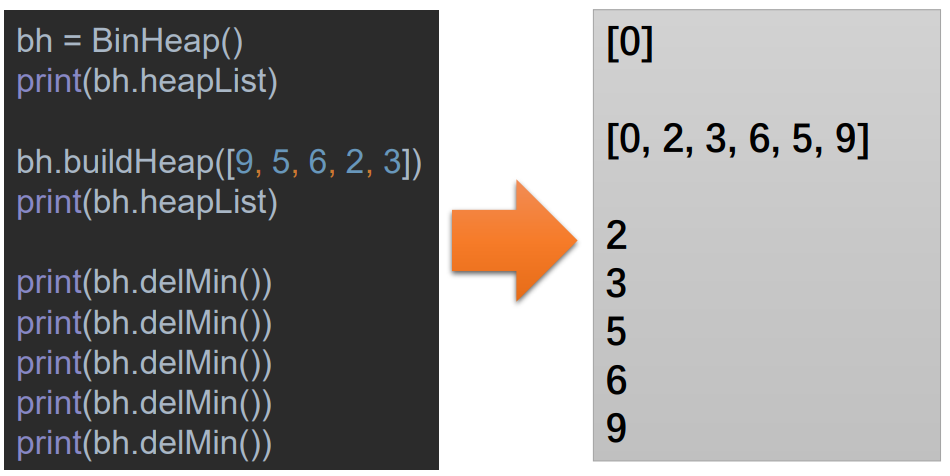

## 二叉堆

二叉堆本质上是一种完全二叉树，它分为两个类型：

- 最大堆

- 最小堆

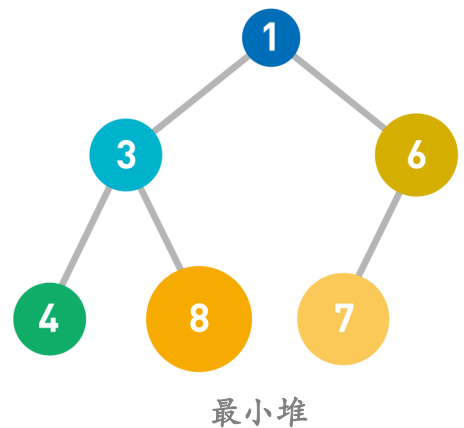

### 什么是二叉堆？

- 最大堆任何一个父节点的值，都大于等于它左右孩子节点的值。

- 最小堆任何一个父节点的值，都小于等于它左右孩子节点的值。

## 二叉堆操作

最小二叉堆实现的基本操作如下：

- BinHeap() 创建一个新的，空的二叉堆。

- insert(k) 向堆添加一个新项。

- findMin() 返回具有最小键值的项，并将项留在堆中。

- delMin() 返回具有最小键值的项，从堆中删除该项。

- 如果堆是空的，isEmpty() 返回 true，否则返回 false。

- size() 返回堆中的项数。

- buildHeap(list) 从键列表构建一个新的堆。

```
bh = BinHeap()
print(bh.heapList)
bh.buildHeap([9, 5, 6, 2, 3])
print(bh.heapList)
print(bh.delMin())
print(bh.delMin())
print(bh.delMin())
print(bh.delMin())
print(bh.delMin())
```

## 二叉堆实现

### 结构属性

完全二叉树的一个属性是：用列表表示，则父级和子级之间是 2p 和 2p+1 关系。

### 排序属性

堆的排序属性如下： 在堆中，对于具有父 p 的每个节点 x， p 中的键小于或等于 x 中的键。


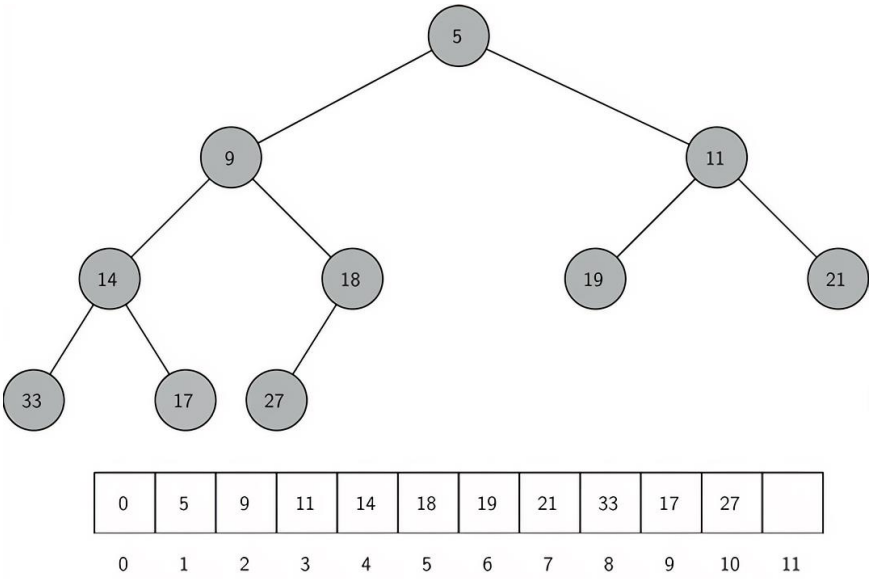

### 堆操作

1. 构造函数：

整个二叉堆由单个列表表示， 所以构造函数将初始化列表和一个 currentSize 属性来跟踪堆的当前大小。

```
class BinHeap:
    def __init__(self):
        self.heapList = [0]
        self.currentSize = 0
```

2. insert(k)：

- 将项添加到列表中最简单最有效的方法是将项附加到列表的末尾 ，但必须维护满足结构属性和排序属性。

- 方案：通过比较新添加的项与其父项，如果新添加的项小于其父项， 则将项与其父项交换。

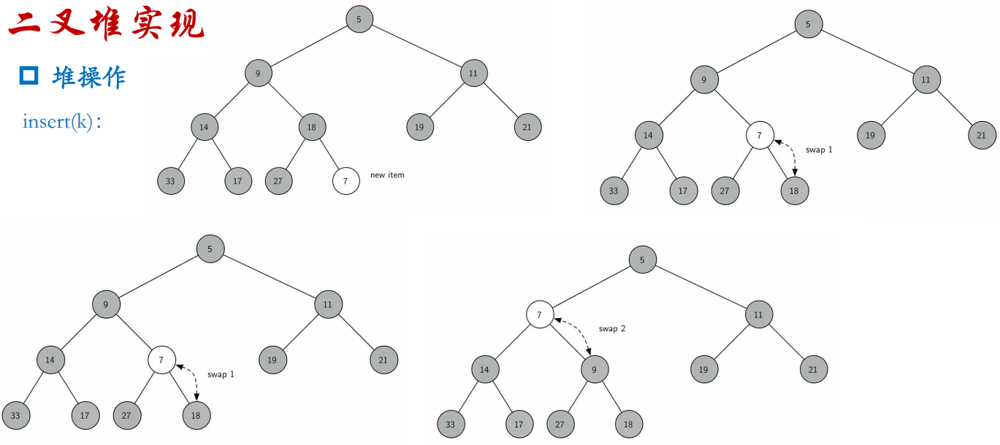

```
def insert(self, k):
    self.heapList.append(k)
    self.currentSize = self.currentSize + 1
    self.percUp(self.currentSize)
```

```
def percUp(self, i):
    while i // 2 > 0:
        if self.heapList[i] < self.heapList[i // 2]:
            tmp = self.heapList[i // 2]
            self.heapList[i // 2] = self.heapList[i]
            self.heapList[i] = tmp
        i = i // 2
```

3. delMin()：

两步保持结构属性和顺序属性：

- 获取列表中的最后一个项并将其移动到根位置保持堆结构属性

- 从新根节点开始，依次向下和最小的子节点交换保持顺序属性

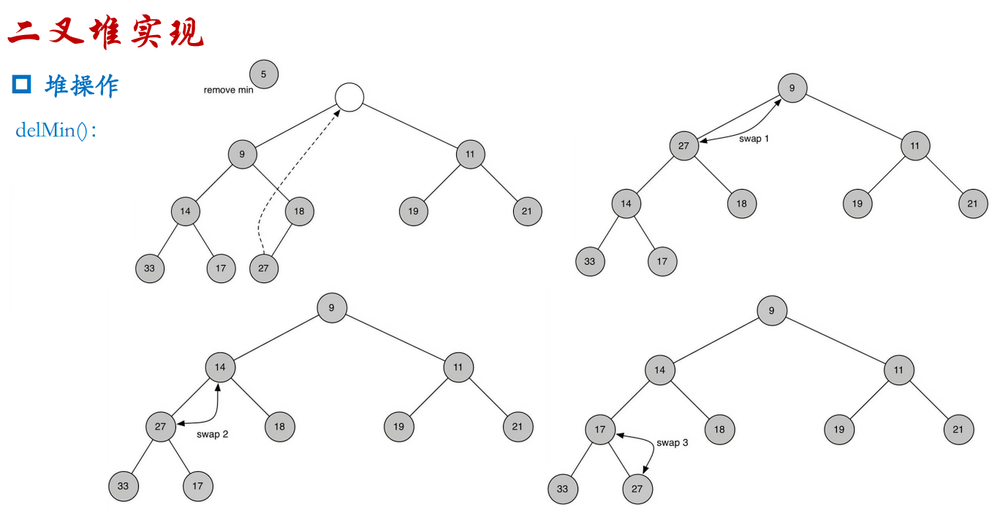

```
def delMin(self):
    retval = self.heapList[1]
    self.heapList[1] = self.heapList[self.currentSize]
    self.currentSize = self.currentSize - 1
    self.heapList.pop()
    self.percDown(1)
    return retval

def percDown(self, i):
    while (i * 2) <= self.currentSize:
        mc = self.minChild(i)
        if self.heapList[i] > self.heapList[mc]:
            tmp = self.heapList[i]
            self.heapList[i] = self.heapList[mc]
            self.heapList[mc] = tmp
        i = mc

def minChild(self, i):
    if i * 2 + 1 > self.currentSize:
        return i * 2
    else:
        if self.heapList[i*2] < self.heapList[i*2+1]:
            return i * 2
        else:
            return i * 2 + 1
```

## 构建二叉堆操作

buildHeap(alist)：

```
def buildHeap(self, alist):
    i = len(alist) // 2
    self.currentSize = len(alist)
    self.heapList = [0] + alist[:]
    while (i > 0):
        self.percDown(i)
        i = i - 1
```

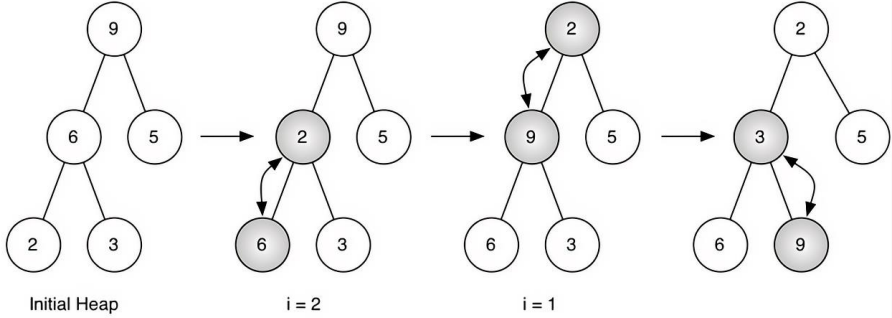

### 复杂度

```
O(nlogn) or O(n) ?
```


In [42]:
def buildHeap(self, alist):
    i = len(alist) // 2
    self.currentSize = len(alist)
    self.heapList = [0] + alist[:]
    while (i > 0):
        self.percDown(i)
        i = i - 1

设计一个找到数据流中第K大元素的类（class）。注意是排序后的第 K 大元素，不是第 K 个不同的元素。你的 KthLargest 类需要一个同时接收整数 k 和整数数组 nums 的构造器，它包含数据流中的初始元素。

每次调用 KthLargest.add，返回当前数据流中第 K 大的元素。

```
int k = 3;
int[] arr = [4,5,8,2];
KthLargest kthLargest = new KthLargest(3, arr);
kthLargest.add(3); // returns 4
kthLargest.add(5); // returns 5
kthLargest.add(10); // returns 5
kthLargest.add(9); // returns 8
kthLargest.add(4); // returns 8
```

说明: 你可以假设 nums 的长度 ≥ k-1 且 k ≥ 1。

In [43]:
import heapq
h = []
heapq.heappush(h,5)
heapq.heappush(h,2)
heapq.heappush(h,8)
heapq.heappush(h,4)
print(heapq.heappop(h))
print(heapq.heappop(h))
print(heapq.heappop(h))
print(heapq.heappop(h))
h = [9,8,7,6,2,4,5]
print(h)
heapq.heapify(h)
print(h)

2
4
5
8
[9, 8, 7, 6, 2, 4, 5]
[2, 6, 4, 9, 8, 7, 5]


In [44]:
class KthLargest(object):
    def __init__(self, k, nums):
        self.pool = nums
        self.size = len(self.pool)
        self.k = k
        heapq.heapify(self.pool)
        while self.size > k:
            heapq.heappop(self.pool)
            self.size -= 1
    def add(self, val):
        if self.size < self.k:
            heapq.heappush(self.pool, val)
            self.size += 1
        elif val > self.pool[0]:
            heapq.heapreplace(self.pool, val)
        return self.pool[0]

k = 3
arr = [4,5,8,2]
kthLargest = KthLargest(3, arr)
print(kthLargest.add(3))
print(kthLargest.add(5))
print(kthLargest.add(10))
print(kthLargest.add(9))
print(kthLargest.add(4))

4
5
5
8
8


# 18. 二叉查找树



1. 二叉查找树（又叫作二叉搜索树或二叉排序树）是一种数据结构 。其二叉查找树的兩個性質，且每个结点最多有两个子结点。

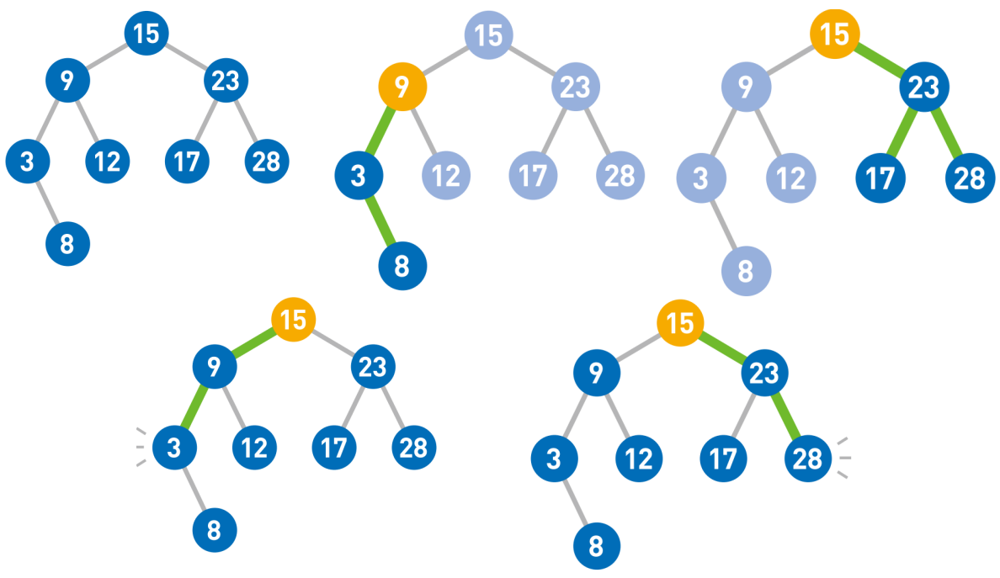


2. 第一个是每个结点的值均大于其左子树上任意一个结点的值。比如结点 9 大于其左子树上的3和 8。

3. 第二个是每个结点的值均小于其右子树上任意一个结点的值。比如结点 15 小于其右子树上的 23、17 和 28。

4. 根据这两个性质可以得到以下结论。首先，二叉查找树的最小结点要从顶端开始，往其左下的末端寻找。此处最小值为 3。

5. 反过来，二叉查找树的最大结点要从顶端开始，往其右下的末端寻找。此处最大值为 28。

- Map() 创建一个新的空 map 。

- put(key，val) 向 map 中添加一个新的键值对。 如果键已经在 map 中，那么用新值替换旧值。

- get(key) 给定一个键， 返回存储在 map 中的值， 否则为 None。

- del 使用 del map[key] 形式的语句从 map 中删除键值对。

- len() 返回存储在映射中的键值对的数量。

- in 返回 True 如果给定的键在 map 中。

## 二叉查找树实现
```
class BinarySearchTree:
    def __init__(self):
        self.root = None
        self.size = 0
    def length(self):
        return self.size
    def __len__(self):
        return self.size

class TreeNode:
    def __init__(self,key,val,left=None,right=None,parent=None):
        self.key = key
        self.payload = val
        self.leftChild = left
        self.rightChild = right
        self.parent = parent
    def hasLeftChild(self):
        return self.leftChild
    def hasRightChild(self):
        return self.rightChild
    def isLeftChild(self):
        return self.parent and self.parent.leftChild == self
    def isRightChild(self):
        return self.parent and self.parent.rightChild == self

    def put(self,key,val):
        if self.root:
            self._put(key,val,self.root)
        else:
            self.root = TreeNode(key,val)
        self.size = self.size + 1
    def _put(self,key,val,currentNode):
        if key < currentNode.key:
            if currentNode.hasLeftChild():
                self._put(key,val,currentNode.leftChild)
            else:
                currentNode.leftChild = TreeNode(key,val,parent=currentNode)
        else:
            if currentNode.hasRightChild():
                self._put(key,val,currentNode.rightChild)
            else:
                currentNode.rightChild = TreeNode(key,val,parent=currentNode)
```

In [45]:
class BinarySearchTree:
    def __init__(self):
        self.root = None
        self.size = 0
    def length(self):
        return self.size
    def __len__(self):
        return self.size

class TreeNode:
    def __init__(self,key,val,left=None,right=None,parent=None):
        self.key = key
        self.payload = val
        self.leftChild = left
        self.rightChild = right
        self.parent = parent
    def hasLeftChild(self):
        return self.leftChild
    def hasRightChild(self):
        return self.rightChild
    def isLeftChild(self):
        return self.parent and self.parent.leftChild == self
    def isRightChild(self):
        return self.parent and self.parent.rightChild == self

    def put(self,key,val):
        if self.root:
            self._put(key,val,self.root)
        else:
            self.root = TreeNode(key,val)
        self.size = self.size + 1
    def _put(self,key,val,currentNode):
        if key < currentNode.key:
            if currentNode.hasLeftChild():
                self._put(key,val,currentNode.leftChild)
            else:
                currentNode.leftChild = TreeNode(key,val,parent=currentNode)
        else:
            if currentNode.hasRightChild():
                self._put(key,val,currentNode.rightChild)
            else:
                currentNode.rightChild = TreeNode(key,val,parent=currentNode)

## LC 235. Lowest Common Ancestor of a Binary Search Tree 二叉搜索树的最近公共祖先

Given a binary search tree (BST), find the lowest common ancestor (LCA) of two given nodes in the BST.

According to the definition of LCA on Wikipedia: “The lowest common ancestor is defined between two nodes p and q as the lowest node in T that has both p and q as descendants (where we allow a node to be a descendant of itself).”

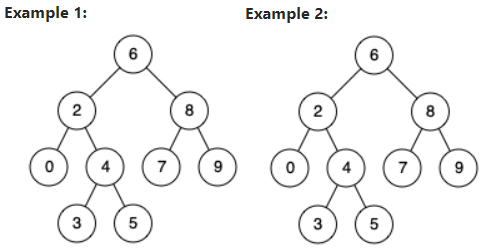

Example 1:

```
Input: root = [6,2,8,0,4,7,9,null,null,3,5], p = 2, q = 8
Output: 6
Explanation: The LCA of nodes 2 and 8 is 6.
节点 2 和节点 8 的最近公共祖先是 6。
```

Example 2:

```
Input: root = [6,2,8,0,4,7,9,null,null,3,5], p = 2, q = 4
Output: 2
Explanation: The LCA of nodes 2 and 4 is 2, since a node can be a descendant of itself according to the LCA definition.
节点 2 和节点 4 的最近公共祖先是 2, 因为根据定义最近公共祖先节点可以为节点本身。
```

Example 3:

```
Input: root = [2,1], p = 2, q = 1
Output: 2
```

Constraints:

- The number of nodes in the tree is in the range $[2, 10^{5}]$.

- $-109$ <= Node.val <= $10^{9}$

- All Node.val are unique.

- p != q

- p and q will exist in the BST.

- 所有节点的值都是唯一的。

- p、q 为不同节点且均存在于给定的二叉搜索树中。



## 解题思路

1. 在二叉搜索树中求两个节点的最近公共祖先，由于二叉搜索树的特殊性质，所以找任意两个节点的最近公共祖先非常简单。

2. python3 利用二叉搜索树的特点，如果p、q的值都小于root，说明p q 肯定在root的左子树中；如果p q都大于root，说明肯定在root的右子树中，如果一个在左一个在右 则说明此时的root记为对应的最近公共祖先


In [46]:
class Solution(object):
    def lowestCommonAncestor(self, root, p, q):
        """
        :type root: TreeNode
        :type p: TreeNode
        :type q: TreeNode
        :rtype: TreeNode
        """
        if p.val<root.val and q.val<root.val:
            return self.lowestCommonAncestor(root.left,p,q)
        if p.val>root.val and q.val>root.val:
            return self.lowestCommonAncestor(root.right,p,q)

# 19 Trie 

## 实际问题
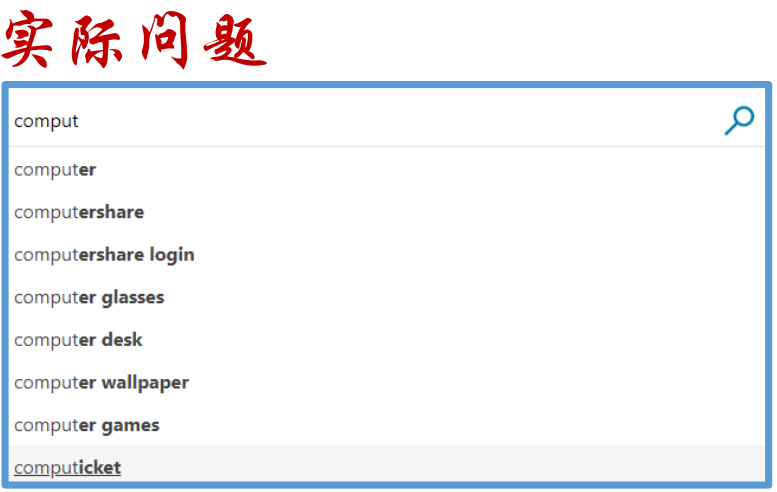

## 字典树(Trie)

- Trie 树的基本结构

- Trie 树的核心思想

- Trie 树的基本性质

- Trie 树的实现

### 基本结构

Trie 树,即字典树,又称单词查找树或键树,是一种树形结构,是一种哈希树的变种。典型应用是用于统计和排序大量的字符串但不仅限于字符串,所以经常被搜索引擎系统用于文本词频统计。

它的优点是:最大限度地减少无谓的字符串比较,查询效率比哈希表高。


### 核心思想

Trie 的核心思想空间换时间。利用字符串的公共前缀来降低查询时间的开销以达到提高效率的目的。

### 基本性质

1.根节点不包含字符,除根节点外每一个节点都只包含一个字符。

2.从根节点到某一节点,路径上经过的字符连接起来,为该节点对应的字符串。

3.每个节点的所有子节点包含的字符都不相同。

### 实现

LC 208.
LC 720. Longest Word in Dictionary 词典中最长的单词

## LeetCode 208. Implement Trie (Prefix Tree) 实现 Trie (前缀树)

A trie (pronounced as "try") or prefix tree is a tree data structure used to efficiently store and retrieve keys in a dataset of strings. There are various applications of this data structure, such as autocomplete and spellchecker.

Implement the Trie class:

- Trie() Initializes the trie object.

- void insert(String word) Inserts the string word into the trie.

- boolean search(String word) Returns true if the string word is in the trie (i.e., was inserted before), and false otherwise.

- boolean startsWith(String prefix) Returns true if there is a previously inserted string word that has the prefix prefix, and false otherwise.

Trie（发音类似 "try"）或者说 前缀树 是一种树形数据结构，用于高效地存储和检索字符串数据集中的键。这一数据结构有相当多的应用情景，例如自动补完和拼写检查。

请你实现 Trie 类：

Trie() 初始化前缀树对象。
void insert(String word) 向前缀树中插入字符串 word 。
boolean search(String word) 如果字符串 word 在前缀树中，返回 true（即，在检索之前已经插入）；否则，返回 false 。
boolean startsWith(String prefix) 如果之前已经插入的字符串 word 的前缀之一为 prefix ，返回 true ；否则，返回 false 。

Example 1:

```
Input
["Trie", "insert", "search", "search", "startsWith", "insert", "search"]
[[], ["apple"], ["apple"], ["app"], ["app"], ["app"], ["app"]]
Output
[null, null, true, false, true, null, true]

Explanation
Trie trie = new Trie();
trie.insert("apple");
trie.search("apple");   // return True
trie.search("app");     // return False
trie.startsWith("app"); // return True
trie.insert("app");
trie.search("app");     // return True
```

Constraints:

- 1 <= word.length, prefix.length <= 2000

- word and prefix consist only of lowercase English letters.

word 和 prefix 仅由小写英文字母组成

- At most 3 * $10^{4}$ calls in total will be made to insert, search, and startsWith.

insert、search 和 startsWith 调用次数 总计 不超过 3 * $10^4$ 次


In [47]:
class TreeNode(object):
    def __init__(self):
        self.word = False
        self.children = {}

class Trie(object):
    def __init__(self):
        """
        Initialize your data structure here.
        """
        self.root = TreeNode()
    def insert(self, word):
        """
        Inserts a word into the trie.
        :type word: str
        :rtype: void
        """
        node = self.root
        for char in word:
            if char not in node.children:
                node.children[char] = TreeNode()
            node = node.children[char]
        node.word = True

    def search(self, word):
        """
        Returns if the word is in the trie.
        :type word: str
        :rtype: bool
        """
        node = self.root
        for char in word:
            if char not in node.children:
                return False
            node = node.children[char]
        return node.word
    def startsWith(self, prefix):
        """
        Returns if there is any word in the trie
        that starts with the given prefix.
        :type prefix: str
        :rtype: bool
        """
        node = self.root
        for char in prefix:
            if char not in node.children:
                return False
            node = node.children[char]
        return True

## LeetCode 720. Longest Word in Dictionary 词典中最长的单词

Given an array of strings words representing an English Dictionary, return the longest word in words that can be built one character at a time by other words in words.

If there is more than one possible answer, return the longest word with the smallest lexicographical order. If there is no answer, return the empty string.


给出一个字符串数组 words 组成的一本英语词典。返回 words 中最长的一个单词，该单词是由 words 词典中其他单词逐步添加一个字母组成。

若其中有多个可行的答案，则返回答案中字典序最小的单词。若无答案，则返回空字符串。



Example 1:

```
Input: words = ["w","wo","wor","worl","world"]
Output: "world"
Explanation: The word "world" can be built one character at a time by "w", "wo", "wor", and "worl".
单词"world"可由"w", "wo", "wor", 和 "worl"逐步添加一个字母组成。
```

Example 2:

```
Input: words = ["a","banana","app","appl","ap","apply","apple"]
Output: "apple"
Explanation: Both "apply" and "apple" can be built from other words in the dictionary. However, "apple" is lexicographically smaller than "apply".
"apply" 和 "apple" 都能由词典中的单词组成。但是 "apple" 的字典序小于 "apply" 
```


Constraints:

- 1 <= words.length <= 1000

- 1 <= words[i].length <= 30

- words[i] consists of lowercase English letters.

所有输入的字符串 words[i] 都只包含小写字母。



In [48]:
class Solution(object):
    def longestWord(self, words):
        valid = set([""])
        for word in sorted(words, key=len):
            if word[:-1] in valid:
                valid.add(word)
        return max(sorted(valid), key=len)
if __name__ == '__main__':
    words = ["a", "banana", "app", "appl", "ap", "apply", "apple"]
    print(Solution().longestWord(words))

apple
